# **0. Mount google drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# **1. Install packages**

In [2]:
%%capture

#Install GIS tools
!pip install mapview

#Install sklearn statistical tools
!pip install scikit-learn
!pip install scikit-learn-extra

# #Install shap for features explanation
# !pip install shap

#Install other tools
!pip install statsmodels
!pip install xgboost
# !pip install tensorflow
!pip install scikit-optimize
# !pip install bayesian-optimization


#**2. Kaggle API initialization**

In [ ]:
!pip install kaggle

# import colab libraries
from google.colab import files

# import kaggle json to connect to kaggle user account to download datsets
files.upload()

!ls -lha kaggle.json
# The Kaggle API client expects this file to be in ~/.kaggle,
# so lets move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

!kaggle competitions list

!kaggle competitions download -c predict-energy-behavior-of-prosumers --force

 # unzip training set to `train` folder
!mkdir Enefit
!unzip predict-energy-behavior-of-prosumers.zip -d Enefit

#**3. Loading libraries**

In [6]:
# Install basic tools
import os

# Install data scientific tools
import pandas as pd
import numpy as np

## Install data visualization tools
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker

## Importing time
import time

## Customize seaborn plot and figures display
sns.set(style="white")
sns.set_style("whitegrid", {'grid.color': 'lightgrey','grid.linestyle': '--'})

## Remove scientific notations and display numbers with 3 decimal points instead
pd.options.display.float_format = '{:,.3f}'.format

## Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

## Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

## Importing geographical libraries
import folium
from folium import plugins

## Prediction models building
# To build statistical models
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

###To build models for prediction
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.linear_model import ElasticNet, SGDRegressor, BayesianRidge
from xgboost import XGBRegressor

# For clustering Locations
from sklearn_extra.cluster import KMedoids

# To scale the data
from sklearn.preprocessing import MinMaxScaler, StandardScaler


# # To check model performance
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
# To regularize model
from sklearn.linear_model import Ridge, Lasso

#For RandomizedSearchCV
from scipy.stats import uniform

# label encoder
from sklearn import preprocessing

##To calculate skewness of datasets
from scipy.stats import skew

# **4. Load the data**

In [5]:
## loading and reading of the dataset files
clients = pd.read_csv('/content/Enefit/client.csv')
electricity_prices = pd.read_csv('/content/Enefit/electricity_prices.csv')
forecast_weather = pd.read_csv('/content/Enefit/forecast_weather.csv')
gas_prices = pd.read_csv('/content/Enefit/gas_prices.csv')
history = pd.read_csv('/content/Enefit/historical_weather.csv')
data = pd.read_csv('/content/Enefit/train.csv')

# **5. Data Overview**

##**5.1 Datasets shapes**

In [11]:
print("Datasets shapes :")
print("clients dataset is constituted with :",clients.shape[0], "rows and",clients.shape[1], "columns")
print("electricity_prices dataset is constituted with :",electricity_prices.shape[0], "rows and",electricity_prices.shape[1], "columns")
print("forecast_weather dataset is constituted with :",forecast_weather.shape[0], "rows and",forecast_weather.shape[1], "columns")
print("gas_prices dataset is constituted with :",gas_prices.shape[0], "rows and",gas_prices.shape[1], "columns")
print("history dataset is constituted with :",history.shape[0], "rows and",history.shape[1], "columns")
print("Training dataset is constituted with :",data.shape[0], "rows and",data.shape[1], "columns")
print("==="*40)

Datasets shapes :
clients dataset is constituted with : 41919 rows and 7 columns
electricity_prices dataset is constituted with : 15286 rows and 4 columns
forecast_weather dataset is constituted with : 3424512 rows and 18 columns
gas_prices dataset is constituted with : 637 rows and 5 columns
history dataset is constituted with : 1710802 rows and 18 columns
Training dataset is constituted with : 2018352 rows and 9 columns


##**5.2 Datasets info**

###**5.2.1 Clients**

In [12]:
# Display datasets info
print("Data info :")
clients.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41919 entries, 0 to 41918
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_type        41919 non-null  int64  
 1   county              41919 non-null  int64  
 2   eic_count           41919 non-null  int64  
 3   installed_capacity  41919 non-null  float64
 4   is_business         41919 non-null  int64  
 5   date                41919 non-null  object 
 6   data_block_id       41919 non-null  int64  
dtypes: float64(1), int64(5), object(1)
memory usage: 2.2+ MB


###**5.2.2 Electricity prices**

In [13]:
# Display datasets info
print("Data info :")
electricity_prices.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15286 entries, 0 to 15285
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   forecast_date  15286 non-null  object 
 1   euros_per_mwh  15286 non-null  float64
 2   origin_date    15286 non-null  object 
 3   data_block_id  15286 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 477.8+ KB


###**5.2.3 Weather forecast**

In [14]:
# Display datasets info
print("Data info :")
forecast_weather.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424512 entries, 0 to 3424511
Data columns (total 18 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   latitude                           float64
 1   longitude                          float64
 2   origin_datetime                    object 
 3   hours_ahead                        int64  
 4   temperature                        float64
 5   dewpoint                           float64
 6   cloudcover_high                    float64
 7   cloudcover_low                     float64
 8   cloudcover_mid                     float64
 9   cloudcover_total                   float64
 10  10_metre_u_wind_component          float64
 11  10_metre_v_wind_component          float64
 12  data_block_id                      int64  
 13  forecast_datetime                  object 
 14  direct_solar_radiation             float64
 15  surface_solar_radiation_downwards  float64
 16  snowfa

###**5.2.4 Gas prices**

In [15]:
# Display datasets info
print("Data info :")
gas_prices.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637 entries, 0 to 636
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   forecast_date          637 non-null    object 
 1   lowest_price_per_mwh   637 non-null    float64
 2   highest_price_per_mwh  637 non-null    float64
 3   origin_date            637 non-null    object 
 4   data_block_id          637 non-null    int64  
dtypes: float64(2), int64(1), object(2)
memory usage: 25.0+ KB


###**5.2.5 History**

In [16]:
# Display datasets info
print("Data info :")
history.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1710802 entries, 0 to 1710801
Data columns (total 18 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   datetime                object 
 1   temperature             float64
 2   dewpoint                float64
 3   rain                    float64
 4   snowfall                float64
 5   surface_pressure        float64
 6   cloudcover_total        int64  
 7   cloudcover_low          int64  
 8   cloudcover_mid          int64  
 9   cloudcover_high         int64  
 10  windspeed_10m           float64
 11  winddirection_10m       int64  
 12  shortwave_radiation     float64
 13  direct_solar_radiation  float64
 14  diffuse_radiation       float64
 15  latitude                float64
 16  longitude               float64
 17  data_block_id           float64
dtypes: float64(12), int64(5), object(1)
memory usage: 234.9+ MB


###**5.2.6 Data**

In [17]:
# Display datasets info
print("Data info :")
data.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 9 columns):
 #   Column              Dtype  
---  ------              -----  
 0   county              int64  
 1   is_business         int64  
 2   product_type        int64  
 3   target              float64
 4   is_consumption      int64  
 5   datetime            object 
 6   data_block_id       int64  
 7   row_id              int64  
 8   prediction_unit_id  int64  
dtypes: float64(1), int64(7), object(1)
memory usage: 138.6+ MB


##**5.3 Datasets head**

###**5.3.1 Clients**

In [18]:
# Display the first 5 rows
print("Data head :")
clients.head()

Data head :


,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id
0,1,0,108,952.890,0,2021-09-01,2
1,2,0,17,166.400,0,2021-09-01,2
2,3,0,688,"7,207.880",0,2021-09-01,2
3,0,0,5,400.000,1,2021-09-01,2
4,1,0,43,"1,411.000",1,2021-09-01,2


###**5.3.2 Electricity prices**

In [19]:
# Display the first 5 rows
print("Data head :")
electricity_prices.head()

Data head :


,forecast_date,euros_per_mwh,origin_date,data_block_id
0,2021-09-01 00:00:00,92.510,2021-08-31 00:00:00,1
1,2021-09-01 01:00:00,88.900,2021-08-31 01:00:00,1
2,2021-09-01 02:00:00,87.350,2021-08-31 02:00:00,1
3,2021-09-01 03:00:00,86.880,2021-08-31 03:00:00,1
4,2021-09-01 04:00:00,88.430,2021-08-31 04:00:00,1


###**5.3.3 Weather forecast**

In [20]:
# Display the first 5 rows
print("Data head :")
forecast_weather.head()

Data head :


,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.600,21.700,2021-09-01 02:00:00,1,15.656,11.554,0.905,0.020,0.000,0.906,-0.411,-9.106,1,2021-09-01 03:00:00,0.000,0.000,0.000,0.000
1,57.600,22.200,2021-09-01 02:00:00,1,13.004,10.690,0.886,0.004,0.000,0.887,0.206,-5.355,1,2021-09-01 03:00:00,0.000,0.000,0.000,0.000
2,57.600,22.700,2021-09-01 02:00:00,1,14.207,11.672,0.729,0.006,0.000,0.730,1.452,-7.418,1,2021-09-01 03:00:00,0.000,0.000,0.000,0.000
3,57.600,23.200,2021-09-01 02:00:00,1,14.845,12.265,0.336,0.074,0.001,0.385,1.091,-9.164,1,2021-09-01 03:00:00,0.000,0.000,0.000,0.000
4,57.600,23.700,2021-09-01 02:00:00,1,15.294,12.459,0.103,0.088,0.000,0.177,1.268,-8.976,1,2021-09-01 03:00:00,0.000,0.000,0.000,0.000


###**5.3.4 Gas prices**

In [21]:
# Display the first 5 rows
print("Data head :")
gas_prices.head()

Data head :


,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id
0,2021-09-01,45.230,46.320,2021-08-31,1
1,2021-09-02,45.620,46.290,2021-09-01,2
2,2021-09-03,45.850,46.400,2021-09-02,3
3,2021-09-04,46.300,46.800,2021-09-03,4
4,2021-09-05,46.300,46.580,2021-09-04,5


###**5.3.5 Historical weather**

In [22]:
# Display the first 5 rows
print("Data head :")
history.head()

Data head :


,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id
0,2021-09-01 00:00:00,14.200,11.600,0.000,0.000,"1,015.900",31,31,0,11,7.083,8,0.000,0.000,0.000,57.600,21.700,1.000
1,2021-09-01 00:00:00,13.900,11.500,0.000,0.000,"1,010.700",33,37,0,0,5.111,359,0.000,0.000,0.000,57.600,22.200,1.000
2,2021-09-01 00:00:00,14.000,12.500,0.000,0.000,"1,015.000",31,34,0,0,6.333,355,0.000,0.000,0.000,57.600,22.700,1.000
3,2021-09-01 00:00:00,14.600,11.500,0.000,0.000,"1,017.300",0,0,0,0,8.083,297,358.000,277.000,81.000,57.600,23.200,1.000
4,2021-09-01 00:00:00,15.700,12.900,0.000,0.000,"1,014.000",22,25,0,0,8.417,5,0.000,0.000,0.000,57.600,23.700,1.000


###**5.3.6 Data**

In [23]:
# Display the first 5 rows
print("Data head :")
data.sample(10)

Data head :


,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
1938965,11,1,1,201.582,1,2023-05-07 06:00:00,613,1938965,46
1396886,8,1,3,4.510,0,2022-11-18 14:00:00,443,1396886,33
879220,14,0,1,41.205,0,2022-06-10 16:00:00,282,879220,53
44078,4,1,3,0.000,0,2021-09-16 01:00:00,15,44078,18
1964059,3,1,3,666.100,1,2023-05-14 23:00:00,620,1964059,14
1992710,11,0,3,224.227,0,2023-05-23 20:00:00,629,1992710,45
1778239,11,1,3,"6,806.626",1,2023-03-17 06:00:00,562,1778239,48
656875,3,1,1,77.164,1,2022-04-02 23:00:00,213,656875,13
449284,4,0,1,0.000,0,2022-01-27 16:00:00,148,449284,15
1684901,4,0,1,28.431,1,2023-02-15 22:00:00,532,1684901,15


# **6. Map of ENEFIT area**

In [24]:
# Let's have a glance at ENEFIT on a Map
base_map = folium.Map(location=[58.5,25], width ='50%',height='90%', zoom_start =6.5, crs='EPSG3857', tiles='OpenStreetMap', attr='https://www.openstreetmap.org/relation/2315704')
X = forecast_weather[['latitude','longitude']]
folium.Marker(location=[X['latitude'].min(), X['longitude'].min()], icon=folium.Icon(color='red')).add_to(base_map)
folium.Marker(location=[X['latitude'].min(), X['longitude'].max()], icon=folium.Icon(color='red')).add_to(base_map)
folium.Marker(location=[X['latitude'].max(), X['longitude'].min()], icon=folium.Icon(color='red')).add_to(base_map)
folium.Marker(location=[X['latitude'].max(), X['longitude'].max()], icon=folium.Icon(color='red')).add_to(base_map)
base_map

# **7. Numerical data statistics summary**

###**7.1 Clients**

In [25]:
# Let's check numerical data statistics
clients[clients.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
product_type,"41,919.000",NaN,NaN,NaN,1.899,1.082,0.000,1.000,2.000,3.000,3.000
county,"41,919.000",NaN,NaN,NaN,7.297,4.781,0.000,3.000,7.000,11.000,15.000
eic_count,"41,919.000",NaN,NaN,NaN,73.345,144.064,5.000,13.000,32.000,70.000,"1,517.000"
installed_capacity,"41,919.000",NaN,NaN,NaN,"1,450.771","2,422.233",5.500,321.900,645.200,"1,567.150","19,314.310"
is_business,"41,919.000",NaN,NaN,NaN,0.537,0.499,0.000,0.000,1.000,1.000,1.000
date,41919,636,2022-11-26,69,NaN,NaN,NaN,NaN,NaN,NaN,NaN
data_block_id,"41,919.000",NaN,NaN,NaN,322.899,182.076,2.000,167.000,324.000,480.000,637.000


###**7.2 Electricity prices**

In [26]:
# Let's check numerical data statistics
electricity_prices[electricity_prices.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
forecast_date,15286,15286,2021-09-01 00:00:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
euros_per_mwh,"15,286.000",NaN,NaN,NaN,157.064,121.149,-10.060,85.290,128.280,199.798,"4,000.000"
origin_date,15286,15286,2021-08-31 00:00:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
data_block_id,"15,286.000",NaN,NaN,NaN,318.991,183.890,1.000,160.000,319.000,478.000,637.000


###**7.3 Weather forecast**

In [27]:
# Let's check numerical data statistics
forecast_weather[forecast_weather.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
latitude,"3,424,512.000",NaN,NaN,NaN,58.650,0.687,57.600,58.125,58.650,59.175,59.700
longitude,"3,424,512.000",NaN,NaN,NaN,24.950,2.016,21.700,23.200,24.950,26.700,28.200
origin_datetime,3424512,637,2021-09-01 02:00:00,5376,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hours_ahead,"3,424,512.000",NaN,NaN,NaN,24.500,13.853,1.000,12.750,24.500,36.250,48.000
temperature,"3,424,512.000",NaN,NaN,NaN,5.744,7.844,-27.499,0.261,4.873,11.146,31.811
dewpoint,"3,424,512.000",NaN,NaN,NaN,2.412,7.121,-29.684,-2.364,1.836,7.302,23.681
cloudcover_high,"3,424,512.000",NaN,NaN,NaN,0.395,0.444,0.000,0.000,0.089,0.978,1.000
cloudcover_low,"3,424,512.000",NaN,NaN,NaN,0.435,0.439,0.000,0.000,0.231,0.999,1.000
cloudcover_mid,"3,424,512.000",NaN,NaN,NaN,0.359,0.420,0.000,0.000,0.101,0.900,1.000
cloudcover_total,"3,424,512.000",NaN,NaN,NaN,0.682,0.401,0.000,0.265,0.977,1.000,1.000


###**7.4 Gas prices**

In [28]:
# Let's check numerical data statistics
gas_prices[gas_prices.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
forecast_date,637,637,2021-09-01,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lowest_price_per_mwh,637.000,NaN,NaN,NaN,95.037,47.552,28.100,60.000,85.210,109.000,250.000
highest_price_per_mwh,637.000,NaN,NaN,NaN,107.755,54.744,34.000,67.530,93.470,130.740,305.000
origin_date,637,637,2021-08-31,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
data_block_id,637.000,NaN,NaN,NaN,319.000,184.030,1.000,160.000,319.000,478.000,637.000


###**7.5 History**

In [29]:
# Let's check numerical data statistics
history[history.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
datetime,1710802,15275,2022-11-12 15:00:00,114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
temperature,"1,710,802.000",NaN,NaN,NaN,5.741,8.026,-23.700,0.000,5.100,11.200,32.600
dewpoint,"1,710,802.000",NaN,NaN,NaN,2.240,7.224,-25.900,-2.600,1.700,7.200,23.800
rain,"1,710,802.000",NaN,NaN,NaN,0.050,0.208,0.000,0.000,0.000,0.000,16.800
snowfall,"1,710,802.000",NaN,NaN,NaN,0.016,0.075,0.000,0.000,0.000,0.000,2.660
surface_pressure,"1,710,802.000",NaN,NaN,NaN,"1,009.282",13.089,942.900,"1,001.500","1,010.400","1,018.000","1,049.300"
cloudcover_total,"1,710,802.000",NaN,NaN,NaN,60.913,37.769,0.000,25.000,72.000,100.000,100.000
cloudcover_low,"1,710,802.000",NaN,NaN,NaN,46.686,40.748,0.000,3.000,39.000,94.000,100.000
cloudcover_mid,"1,710,802.000",NaN,NaN,NaN,34.407,38.328,0.000,0.000,16.000,72.000,100.000
cloudcover_high,"1,710,802.000",NaN,NaN,NaN,36.051,41.359,0.000,0.000,10.000,85.000,100.000


###**7.6 Data**

In [30]:
# Let's check numerical data statistics
data[data.columns].describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
county,"2,018,352.000",NaN,NaN,NaN,7.297,4.781,0.000,3.000,7.000,11.000,15.000
is_business,"2,018,352.000",NaN,NaN,NaN,0.537,0.499,0.000,0.000,1.000,1.000,1.000
product_type,"2,018,352.000",NaN,NaN,NaN,1.899,1.082,0.000,1.000,2.000,3.000,3.000
target,"2,017,824.000",NaN,NaN,NaN,274.856,909.502,0.000,0.378,31.133,180.206,"15,480.274"
is_consumption,"2,018,352.000",NaN,NaN,NaN,0.500,0.500,0.000,0.000,0.500,1.000,1.000
datetime,2018352,15312,2022-11-27 12:00:00,138,NaN,NaN,NaN,NaN,NaN,NaN,NaN
data_block_id,"2,018,352.000",NaN,NaN,NaN,321.875,182.634,0.000,166.000,323.000,479.000,637.000
row_id,"2,018,352.000",NaN,NaN,NaN,"1,009,175.500","582,648.180",0.000,"504,587.750","1,009,175.500","1,513,763.250","2,018,351.000"
prediction_unit_id,"2,018,352.000",NaN,NaN,NaN,33.045,19.591,0.000,16.000,33.000,50.000,68.000


# **8. Data Preprocessing**

##**8.1 Converting into datetime format**

###**8.1.1 Clients**

In [9]:
# Convert date object into datetime
clients['date'] = pd.to_datetime(clients['date'], infer_datetime_format = True)
clients.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41919 entries, 0 to 41918
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   product_type        41919 non-null  int64         
 1   county              41919 non-null  int64         
 2   eic_count           41919 non-null  int64         
 3   installed_capacity  41919 non-null  float64       
 4   is_business         41919 non-null  int64         
 5   date                41919 non-null  datetime64[ns]
 6   data_block_id       41919 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(5)
memory usage: 2.2 MB


###**8.1.2 Electricity prices**

In [10]:
# Convert time objects into datetimes
electricity_prices["forecast_date"] = pd.to_datetime(electricity_prices["forecast_date"], format='%Y-%m-%d %H:%M:%S')
electricity_prices["origin_date"] = pd.to_datetime(electricity_prices["origin_date"], format='%Y-%m-%d %H:%M:%S')
electricity_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15286 entries, 0 to 15285
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   forecast_date  15286 non-null  datetime64[ns]
 1   euros_per_mwh  15286 non-null  float64       
 2   origin_date    15286 non-null  datetime64[ns]
 3   data_block_id  15286 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 477.8 KB


###**8.1.3 Weather forecast**

In [11]:
# Convert time objects into datetimes
forecast_weather["origin_datetime"] = pd.to_datetime(forecast_weather["origin_datetime"], format='%Y-%m-%d %H:%M:%S')
forecast_weather["forecast_datetime"] = pd.to_datetime(forecast_weather["forecast_datetime"], format='%Y-%m-%d %H:%M:%S')
forecast_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424512 entries, 0 to 3424511
Data columns (total 18 columns):
 #   Column                             Dtype         
---  ------                             -----         
 0   latitude                           float64       
 1   longitude                          float64       
 2   origin_datetime                    datetime64[ns]
 3   hours_ahead                        int64         
 4   temperature                        float64       
 5   dewpoint                           float64       
 6   cloudcover_high                    float64       
 7   cloudcover_low                     float64       
 8   cloudcover_mid                     float64       
 9   cloudcover_total                   float64       
 10  10_metre_u_wind_component          float64       
 11  10_metre_v_wind_component          float64       
 12  data_block_id                      int64         
 13  forecast_datetime                  datetime64[ns]
 14  di

###**8.1.4 Gas prices**

In [12]:
# Display datasets info
print("Data info :")
gas_prices['forecast_date'] = pd.to_datetime(gas_prices['forecast_date'], infer_datetime_format = True)
gas_prices['origin_date'] = pd.to_datetime(gas_prices['origin_date'], infer_datetime_format = True)
gas_prices.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637 entries, 0 to 636
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   forecast_date          637 non-null    datetime64[ns]
 1   lowest_price_per_mwh   637 non-null    float64       
 2   highest_price_per_mwh  637 non-null    float64       
 3   origin_date            637 non-null    datetime64[ns]
 4   data_block_id          637 non-null    int64         
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 25.0 KB


###**8.1.5 History**

In [13]:
# Convert time objects into datetimes
history["datetime"] = pd.to_datetime(history["datetime"], format='%Y-%m-%d %H:%M:%S')
history.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1710802 entries, 0 to 1710801
Data columns (total 18 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   datetime                datetime64[ns]
 1   temperature             float64       
 2   dewpoint                float64       
 3   rain                    float64       
 4   snowfall                float64       
 5   surface_pressure        float64       
 6   cloudcover_total        int64         
 7   cloudcover_low          int64         
 8   cloudcover_mid          int64         
 9   cloudcover_high         int64         
 10  windspeed_10m           float64       
 11  winddirection_10m       int64         
 12  shortwave_radiation     float64       
 13  direct_solar_radiation  float64       
 14  diffuse_radiation       float64       
 15  latitude                float64       
 16  longitude               float64       
 17  data_block_id           float64       
dtypes:

###**8.1.6 Data**

In [14]:
# Convert time objects into datetimes
data["datetime"] = pd.to_datetime(data["datetime"], format='%Y-%m-%d %H:%M:%S')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 9 columns):
 #   Column              Dtype         
---  ------              -----         
 0   county              int64         
 1   is_business         int64         
 2   product_type        int64         
 3   target              float64       
 4   is_consumption      int64         
 5   datetime            datetime64[ns]
 6   data_block_id       int64         
 7   row_id              int64         
 8   prediction_unit_id  int64         
dtypes: datetime64[ns](1), float64(1), int64(7)
memory usage: 138.6 MB


## **8.2 Identification of duplicated values**

###**8.2.1 Clients**

In [15]:
# Check for duplicates
nb_duplicated = clients.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
clients[clients.duplicated()]

Number of duplicated values = 0


Duplicated values :


,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id


###**8.2.2 Electricity prices**

In [16]:
# Check for duplicates
nb_duplicated = electricity_prices.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
electricity_prices[electricity_prices.duplicated()]


Number of duplicated values = 0


Duplicated values :


,forecast_date,euros_per_mwh,origin_date,data_block_id


###**8.2.3 Weather forecast**

In [17]:
# Check for duplicates
nb_duplicated = forecast_weather.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
forecast_weather[forecast_weather.duplicated()]


Number of duplicated values = 0


Duplicated values :


,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation


###**8.2.4 Gas prices**

In [18]:
# Check for duplicates
nb_duplicated = gas_prices.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
gas_prices[gas_prices.duplicated()]


Number of duplicated values = 0


Duplicated values :


,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id


###**8.2.5 History**

In [19]:
# Check for duplicates
nb_duplicated = history.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
history[history.duplicated()]

Number of duplicated values = 0


Duplicated values :


,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id


###**8.2.6 Data**

In [20]:
# Check for duplicates
nb_duplicated = data.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

# Identifying duplicated values in the data
print("Duplicated values :")
data[data.duplicated()]

Number of duplicated values = 0


Duplicated values :


,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id


## **8.3 Identification and treatment of features outliers**

###**8.3.1 Clients**

In [21]:
#Let's check skewness of features
numeric_variables_list = ['product_type', 'eic_count','installed_capacity']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(clients[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,product_type,-0.199
1,eic_count,5.348
2,installed_capacity,4.140


###**8.3.2 Electricity prices**

In [22]:
#Let's check skewness of features
numeric_variables_list = ['euros_per_mwh']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(electricity_prices[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,euros_per_mwh,3.622


In [23]:
#Let's drop the outliers
rows_to_drop = electricity_prices[electricity_prices['euros_per_mwh'] > 1000].index
electricity_prices.drop(rows_to_drop,axis=0, inplace=True)

###**8.3.3 Weather forecast**

In [24]:
#Let's check skewness of features
numeric_variables_list = ['temperature','hours_ahead','dewpoint','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', '10_metre_u_wind_component','10_metre_v_wind_component', 'direct_solar_radiation','surface_solar_radiation_downwards','snowfall','total_precipitation']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(forecast_weather[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,temperature,0.226
1,hours_ahead,0.000
2,dewpoint,0.056
3,cloudcover_high,0.430
4,cloudcover_low,0.314
5,cloudcover_mid,0.622
6,cloudcover_total,-0.736
7,10_metre_u_wind_component,-0.068
8,10_metre_v_wind_component,-0.217
9,direct_solar_radiation,1.536


In [25]:
#Let's put 0 instead of negative solar radiation
forecast_weather.loc[forecast_weather['direct_solar_radiation']< 0, 'direct_solar_radiation']=0
forecast_weather.loc[forecast_weather['surface_solar_radiation_downwards']< 0, 'surface_solar_radiation_downwards']=0

###**8.3.4 Gas prices**

In [26]:
#Let's check skewness of features
numeric_variables_list = ['lowest_price_per_mwh','highest_price_per_mwh']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(gas_prices[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,lowest_price_per_mwh,1.199
1,highest_price_per_mwh,1.169


###**8.3.5 History**

In [27]:
#Let's check skewness of features
numeric_variables_list = ['temperature','dewpoint','rain','snowfall','surface_pressure','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', 'windspeed_10m', 'winddirection_10m','shortwave_radiation','direct_solar_radiation','diffuse_radiation']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(history[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,temperature,0.226
1,dewpoint,0.076
2,rain,9.703
3,snowfall,8.005
4,surface_pressure,-0.423
5,cloudcover_high,0.554
6,cloudcover_low,0.143
7,cloudcover_mid,0.656
8,cloudcover_total,-0.381
9,windspeed_10m,0.863


###**8.3.6 Data**

In [28]:
#Let's check skewness of features
numeric_variables_list = ['target']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(data[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
df_skewness

,Feature,Skewness
0,target,7.676


## **8.4 Identification and treatment of missing values**

####**8.4.1 Clients**

In [29]:
# Checking for missing values in the data
clients.isnull().sum()

product_type          0
county                0
eic_count             0
installed_capacity    0
is_business           0
date                  0
data_block_id         0
dtype: int64

In [30]:
# check for missing datetime
datetimes = clients["date"].array.unique()
datetime_fullrange = pd.date_range(start=min(datetimes), end=max(datetimes), freq='1d')
print("Start date/time: ", min(datetimes))
print("End date/time: ", max(datetimes))
missing_dates = datetime_fullrange.difference(datetimes.unique())
print(f"Missing datetimes  in clients date ({len(missing_dates)}): {missing_dates}")

Start date/time:  2021-09-01 00:00:00
End date/time:  2023-05-29 00:00:00
Missing datetimes  in clients date (0): DatetimeIndex([], dtype='datetime64[ns]', freq='D')


####**8.4.2 Electricity prices**

In [31]:
electricity_prices.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15284 entries, 0 to 15285
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   forecast_date  15284 non-null  datetime64[ns]
 1   euros_per_mwh  15284 non-null  float64       
 2   origin_date    15284 non-null  datetime64[ns]
 3   data_block_id  15284 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 597.0 KB


In [32]:
# check for missing datetime
datetimes = electricity_prices["origin_date"].array.unique()
datetime_fullrange = pd.date_range(start=min(datetimes), end=max(datetimes), freq='H')
print("Start date/time: ", min(datetimes))
print("End date/time: ", max(datetimes))
missing_dates = datetime_fullrange.difference(datetimes.unique())
print(f"Missing datetimes  in electricity origin_date ({len(missing_dates)}): {missing_dates}")

Start date/time:  2021-08-31 00:00:00
End date/time:  2023-05-29 23:00:00
Missing datetimes  in electricity origin_date (4): DatetimeIndex(['2021-12-06 07:00:00', '2022-03-26 02:00:00',
               '2022-08-16 17:00:00', '2023-03-25 02:00:00'],
              dtype='datetime64[ns]', freq=None)


In [33]:
### Let's fill electricity_prices['euros_per_mwh'] missing values
electricity_prices.set_index('origin_date', inplace=True)
electricity_prices = electricity_prices.reindex(pd.date_range(start=min(electricity_prices.index.array.unique()), end=max(electricity_prices.index.array.unique()), freq='H'))
electricity_prices['euros_per_mwh'].interpolate(method='linear', inplace=True)

### Let's fill electricity_prices['data_block_id']
electricity_prices['data_block_id'].ffill(inplace=True)

### Let's fill electricity_prices["forecast_date"] missing values
electricity_prices["forecast_date"] = pd.date_range(start=min(electricity_prices["forecast_date"].array.unique()), end=max(electricity_prices["forecast_date"].array.unique()), freq='H')

###Let's put back the origin_date in the features column
electricity_prices['origin_date'] = electricity_prices.index
electricity_prices.reset_index(inplace=True, drop=True)

In [34]:
  # Checking for missing values in the data
electricity_prices.isnull().sum()

forecast_date    0
euros_per_mwh    0
data_block_id    0
origin_date      0
dtype: int64

####**8.4.3 Weather forecast**

In [35]:
forecast_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424512 entries, 0 to 3424511
Data columns (total 18 columns):
 #   Column                             Dtype         
---  ------                             -----         
 0   latitude                           float64       
 1   longitude                          float64       
 2   origin_datetime                    datetime64[ns]
 3   hours_ahead                        int64         
 4   temperature                        float64       
 5   dewpoint                           float64       
 6   cloudcover_high                    float64       
 7   cloudcover_low                     float64       
 8   cloudcover_mid                     float64       
 9   cloudcover_total                   float64       
 10  10_metre_u_wind_component          float64       
 11  10_metre_v_wind_component          float64       
 12  data_block_id                      int64         
 13  forecast_datetime                  datetime64[ns]
 14  di

In [36]:
forecast_weather ['surface_solar_radiation_downwards'].interpolate(method='linear', inplace=True)

In [37]:
# Checking for missing values in the data
forecast_weather.isnull().sum()

latitude                             0
longitude                            0
origin_datetime                      0
hours_ahead                          0
temperature                          0
dewpoint                             0
cloudcover_high                      0
cloudcover_low                       0
cloudcover_mid                       0
cloudcover_total                     0
10_metre_u_wind_component            0
10_metre_v_wind_component            0
data_block_id                        0
forecast_datetime                    0
direct_solar_radiation               0
surface_solar_radiation_downwards    0
snowfall                             0
total_precipitation                  0
dtype: int64

####**8.4.4 Gas prices**

In [38]:
# Checking for missing values in the data
gas_prices.isnull().sum()

forecast_date            0
lowest_price_per_mwh     0
highest_price_per_mwh    0
origin_date              0
data_block_id            0
dtype: int64

In [39]:
# check for missing datetime
datetimes = gas_prices["origin_date"].array.unique()
datetime_fullrange = pd.date_range(start=min(datetimes), end=max(datetimes), freq='D')
print("Start date/time: ", min(datetimes))
print("End date/time: ", max(datetimes))
missing_dates = datetime_fullrange.difference(datetimes.unique())
print(f"Missing datetimes in gas_prices origin_date ({len(missing_dates)}): {missing_dates}")

Start date/time:  2021-08-31 00:00:00
End date/time:  2023-05-29 00:00:00
Missing datetimes in gas_prices origin_date (0): DatetimeIndex([], dtype='datetime64[ns]', freq='D')


####**8.4.5 History**

In [40]:
# Checking for missing values in the data
history.isnull().sum()

datetime                  0
temperature               0
dewpoint                  0
rain                      0
snowfall                  0
surface_pressure          0
cloudcover_total          0
cloudcover_low            0
cloudcover_mid            0
cloudcover_high           0
windspeed_10m             0
winddirection_10m         0
shortwave_radiation       0
direct_solar_radiation    0
diffuse_radiation         0
latitude                  0
longitude                 0
data_block_id             0
dtype: int64

In [41]:
# check for missing datetime
datetimes = history["datetime"].array.unique()
datetime_fullrange = pd.date_range(start=min(datetimes), end=max(datetimes), freq='H')
print("Start date/time: ", min(datetimes))
print("End date/time: ", max(datetimes))
missing_dates = datetime_fullrange.difference(datetimes.unique())
print(f"Missing datetimes in history datetime ({len(missing_dates)}): {missing_dates}")

Start date/time:  2021-09-01 00:00:00
End date/time:  2023-05-30 10:00:00
Missing datetimes in history datetime (0): DatetimeIndex([], dtype='datetime64[ns]', freq='H')


####**8.4.6 Data**

In [42]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 9 columns):
 #   Column              Dtype         
---  ------              -----         
 0   county              int64         
 1   is_business         int64         
 2   product_type        int64         
 3   target              float64       
 4   is_consumption      int64         
 5   datetime            datetime64[ns]
 6   data_block_id       int64         
 7   row_id              int64         
 8   prediction_unit_id  int64         
dtypes: datetime64[ns](1), float64(1), int64(7)
memory usage: 138.6 MB


In [43]:
# Checking for missing values in the data
data.isnull().sum()

county                  0
is_business             0
product_type            0
target                528
is_consumption          0
datetime                0
data_block_id           0
row_id                  0
prediction_unit_id      0
dtype: int64

In [44]:
# Checking for missing values in the data
# Drop missing values
# data.dropna(inplace=True)

In [45]:
# check for missing datetime
datetimes = data["datetime"].array.unique()
datetime_fullrange = pd.date_range(start=min(datetimes), end=max(datetimes), freq='H')
print("Start date/time: ", min(datetimes))
print("End date/time: ", max(datetimes))
missing_dates = datetime_fullrange.difference(datetimes.unique())
print(f"Missing datetimes in data datetime ({len(missing_dates)}): {missing_dates}")

Start date/time:  2021-09-01 00:00:00
End date/time:  2023-05-31 23:00:00
Missing datetimes in data datetime (0): DatetimeIndex([], dtype='datetime64[ns]', freq='H')


In [46]:
data['target']=data.groupby(['prediction_unit_id','data_block_id','is_consumption'], )['target'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('1st iteration:',data.isnull().sum()['target'])

<ipython-input-46-61d82aa55468>:1: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  data['target']=data.groupby(['prediction_unit_id','data_block_id','is_consumption'], )['target'].apply(lambda x:x.fillna(x.median()))


1st iteration: 0


## **8.5 Features Engineering**

###**8.5.1 Clients**

In [47]:
# Extract date/time features from datetime column
clients['year'] = clients['date'].dt.year
clients['month'] = clients['date'].dt.month
clients['day'] = clients['date'].dt.day
clients['hour'] = clients['date'].dt.hour

clients['dayofyear'] = clients['date'].dt.dayofyear
clients['dayofweek'] = clients['date'].dt.dayofweek
clients['weekofyear'] = clients['date'].dt.isocalendar().week.astype("int")
clients['quarter'] = clients['date'].dt.quarter

clients.sample(5)

,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id,year,month,day,hour,dayofyear,dayofweek,weekofyear,quarter
38420,3,1,68,601.700,0,2023-04-07,585,2023,4,7,0,97,4,14,2
117,3,14,67,"3,114.600",1,2021-09-02,3,2021,9,2,0,245,3,35,3
6452,0,5,5,"1,160.000",1,2021-12-13,105,2021,12,13,0,347,0,50,4
12850,1,7,11,463.600,1,2022-03-21,203,2022,3,21,0,80,0,12,1
36094,3,13,27,937.900,1,2023-03-02,549,2023,3,2,0,61,3,9,1


###**8.5.2 Electricity prices**

In [48]:
# Extract date/time features from datetime column
electricity_prices['year'] = electricity_prices['origin_date'].dt.year
electricity_prices['month'] = electricity_prices['origin_date'].dt.month
electricity_prices['day'] = electricity_prices['origin_date'].dt.day
electricity_prices['hour'] = electricity_prices['origin_date'].dt.hour

electricity_prices['dayofyear'] = electricity_prices['origin_date'].dt.dayofyear
electricity_prices['dayofweek'] = electricity_prices['origin_date'].dt.dayofweek
electricity_prices['weekofyear'] = electricity_prices['origin_date'].dt.isocalendar().week.astype("int")
electricity_prices['quarter'] = electricity_prices['origin_date'].dt.quarter

electricity_prices.sample(5)

,forecast_date,euros_per_mwh,data_block_id,origin_date,year,month,day,hour,dayofyear,dayofweek,weekofyear,quarter
2587,2021-12-17 19:00:00,186.420,108.000,2021-12-16 19:00:00,2021,12,16,19,350,3,50,4
11216,2022-12-12 08:00:00,532.130,468.000,2022-12-11 08:00:00,2022,12,11,8,345,6,49,4
7382,2022-07-05 14:00:00,92.010,308.000,2022-07-04 14:00:00,2022,7,4,14,185,0,27,3
1145,2021-10-18 17:00:00,183.740,48.000,2021-10-17 17:00:00,2021,10,17,17,290,6,41,4
11443,2022-12-21 19:00:00,232.480,477.000,2022-12-20 19:00:00,2022,12,20,19,354,1,51,4


###**8.5.3 Weather forecast**

In [49]:
# Extract date/time features from datetime column
forecast_weather['year'] = forecast_weather['origin_datetime'].dt.year
forecast_weather['month'] = forecast_weather['origin_datetime'].dt.month
forecast_weather['day'] = forecast_weather['origin_datetime'].dt.day
forecast_weather['hour'] = forecast_weather['origin_datetime'].dt.hour

forecast_weather['dayofyear'] = forecast_weather['origin_datetime'].dt.dayofyear
forecast_weather['dayofweek'] = forecast_weather['origin_datetime'].dt.dayofweek
forecast_weather['weekofyear'] = forecast_weather['origin_datetime'].dt.isocalendar().week.astype("int")
forecast_weather['quarter'] = forecast_weather['origin_datetime'].dt.quarter

forecast_weather.sample(5)

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation,year,month,day,hour,dayofyear,dayofweek,weekofyear,quarter
682762,57.600,26.700,2022-01-06 01:00:00,1,0.144,-1.122,0.322,1.000,0.998,1.000,1.437,4.404,128,2022-01-06 02:00:00,0.000,0.000,0.000,0.000,2022,1,6,1,6,3,1,1
1298740,59.700,22.700,2022-04-30 02:00:00,28,4.075,2.526,0.000,0.000,0.112,0.112,4.231,3.113,242,2022-05-01 06:00:00,244.417,62.839,0.000,0.000,2022,4,30,2,120,5,17,2
695518,59.700,27.700,2022-01-08 01:00:00,18,-3.420,-4.528,1.000,0.316,1.000,1.000,-5.103,6.154,130,2022-01-08 19:00:00,0.000,0.000,0.000,0.000,2022,1,8,1,8,5,1,1
2154575,58.200,23.200,2022-10-06 02:00:00,38,13.518,11.001,0.996,0.160,0.012,0.997,10.154,7.843,401,2022-10-07 16:00:00,144.955,144.925,0.000,0.000,2022,10,6,2,279,3,40,4
557046,59.100,21.700,2021-12-13 01:00:00,30,6.417,5.282,1.000,1.000,1.000,1.000,6.126,8.825,104,2021-12-14 07:00:00,0.000,0.000,0.000,0.000,2021,12,13,1,347,0,50,4


###**8.5.4 Gas prices**

In [50]:
# Extract date/time features from datetime column
gas_prices['year'] = gas_prices['origin_date'].dt.year
gas_prices['month'] = gas_prices['origin_date'].dt.month
gas_prices['day'] = gas_prices['origin_date'].dt.day

gas_prices['dayofyear'] = gas_prices['origin_date'].dt.dayofyear
gas_prices['dayofweek'] = gas_prices['origin_date'].dt.dayofweek
gas_prices['weekofyear'] = gas_prices['origin_date'].dt.isocalendar().week.astype("int")
gas_prices['quarter'] = gas_prices['origin_date'].dt.quarter

gas_prices.sample(5)

,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id,year,month,day,dayofyear,dayofweek,weekofyear,quarter
231,2022-04-20,94.810,107.000,2022-04-19,232,2022,4,19,109,1,16,2
439,2022-11-14,99.000,108.000,2022-11-13,440,2022,11,13,317,6,45,4
105,2021-12-15,85.000,90.640,2021-12-14,106,2021,12,14,348,1,50,4
473,2022-12-18,112.000,135.000,2022-12-17,474,2022,12,17,351,5,50,4
6,2021-09-07,46.350,47.600,2021-09-06,7,2021,9,6,249,0,36,3


###**8.5.5 History**

In [51]:
# Extract date/time features from datetime column
history['year'] = history['datetime'].dt.year
history['month'] = history['datetime'].dt.month
history['day'] = history['datetime'].dt.day
history['hour'] = history['datetime'].dt.hour

history['dayofyear'] = history['datetime'].dt.dayofyear
history['dayofweek'] = history['datetime'].dt.dayofweek
history['weekofyear'] = history['datetime'].dt.isocalendar().week.astype("int")
history['quarter'] = history['datetime'].dt.quarter

history.sample(5)

,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id,year,month,day,hour,dayofyear,dayofweek,weekofyear,quarter
886604,2022-07-27 20:00:00,18.200,11.200,0.000,0.000,996.300,93,84,29,1,1.278,198,34.000,5.000,29.000,57.600,27.700,331.000,2022,7,27,20,208,2,30,3
765137,2022-06-12 15:00:00,20.000,10.400,0.000,0.000,"1,003.400",65,19,54,51,4.194,205,478.000,320.000,158.000,58.800,26.200,286.000,2022,6,12,15,163,6,23,2
1447662,2023-02-21 13:00:00,-4.400,-7.000,0.000,0.000,"1,001.700",100,100,83,92,4.083,28,198.000,8.000,190.000,58.800,23.700,540.000,2023,2,21,13,52,1,8,1
1310316,2023-01-01 11:00:00,3.900,3.800,0.100,0.000,993.400,100,99,100,99,2.500,286,22.000,0.000,22.000,57.900,27.700,489.000,2023,1,1,11,1,6,52,1
1142693,2022-10-31 02:00:00,3.800,-1.200,0.000,0.000,"1,001.100",22,25,0,0,6.583,114,0.000,0.000,0.000,58.800,28.200,426.000,2022,10,31,2,304,0,44,4


###**8.5.6 Data**

In [52]:
# Extract date/time features from datetime column
data['year'] = data['datetime'].dt.year
data['month'] = data['datetime'].dt.month
data['day'] = data['datetime'].dt.day
data['hour'] = data['datetime'].dt.hour

data['dayofyear'] = data['datetime'].dt.dayofyear
data['dayofweek'] = data['datetime'].dt.dayofweek
data['weekofyear'] = data['datetime'].dt.isocalendar().week.astype("int")
data['quarter'] = data['datetime'].dt.quarter

data.sample(5)

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,year,month,day,hour,dayofyear,dayofweek,weekofyear,quarter
696622,14,0,1,0.000,0,2022-04-15 03:00:00,226,696622,53,2022,4,15,3,105,4,15,2
1967933,13,0,1,4.962,1,2023-05-16 03:00:00,622,1967933,50,2023,5,16,3,136,1,20,2
1200717,4,1,0,637.415,1,2022-09-19 14:00:00,383,1200717,17,2022,9,19,14,262,0,38,3
1227117,4,1,1,156.373,1,2022-09-27 19:00:00,391,1227117,66,2022,9,27,19,270,1,39,3
128541,0,0,2,8.998,1,2021-10-14 11:00:00,43,128541,1,2021,10,14,11,287,3,41,4


# **10.Univariate Analysis**

## **10.1 Functions for univariate analyses**

In [53]:
# Exploration of numerical variables
def hist_plot(data, numeric_variables_list, bins=None):

  #Customize seaborn plot with grid lines
  sns.set_style("whitegrid", {'grid.color': 'lightgrey','grid.linestyle': '--'})

  #Plot for each variable two plots constituted with a boxplot and a histplot
  for var in numeric_variables_list:

    fig, axs = plt.subplots(nrows=2, ncols=1,                                     # The figure has 2 subplots, one on top of the other
                            sharex=True,                                          # The subplots share the x axis
                            gridspec_kw={"height_ratios": (.3, .7)},              # The figure frame is shared among the two subplots, the first subplot will take 30% of the frame height, while the bottom plot will take 70 %
                            figsize=(10, 5))                                      # The size of the figure is set by default to width = 10 and height = 5

    sns.boxplot(data=data, x=var, ax=axs[0], showmeans=True, color='gold')        # Plot the seaborn boxplot with gold color showing the mean value point
    sns.histplot(data=data, x=var, kde=True, ax=axs[1], bins=bins)              # Plot the seaborn histplot with automatique definition of the number of bins and with the kernel density

    lgnd1 = axs[1].axvline(np.mean(data[var]), color='g', linestyle='--')         # Add mean green vertical axis to the histogram
    lgnd2 =axs[1].axvline(np.median(data[var]), color='black', linestyle='-')     # Add median black vertical axis to the histogram
    axs[1].legend((lgnd1, lgnd2), ('Average', 'Median'), loc='upper right')       # Show the legend of the histogram
    axs[0].set(xlabel=None)                                                       # Remove the boxplot x axis label as it is the same shared with the histogram

    fig.tight_layout()                                                            # Adjust the plot within the figure

## **10.2 Numerical variables univariate analysis**

###**10.2.1 Clients**

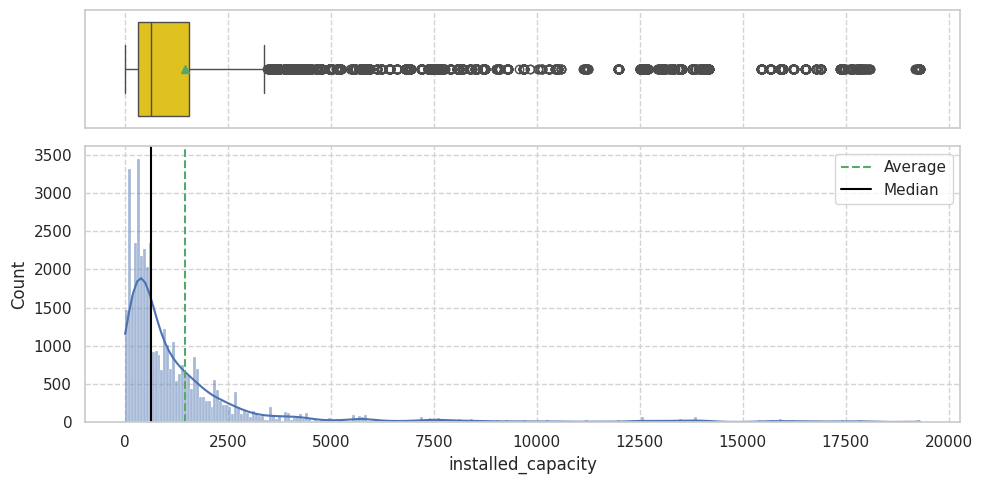

In [76]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['installed_capacity']
hist_plot(clients, numeric_variables_list, bins='auto')

###**10.2.2 Electricity prices**

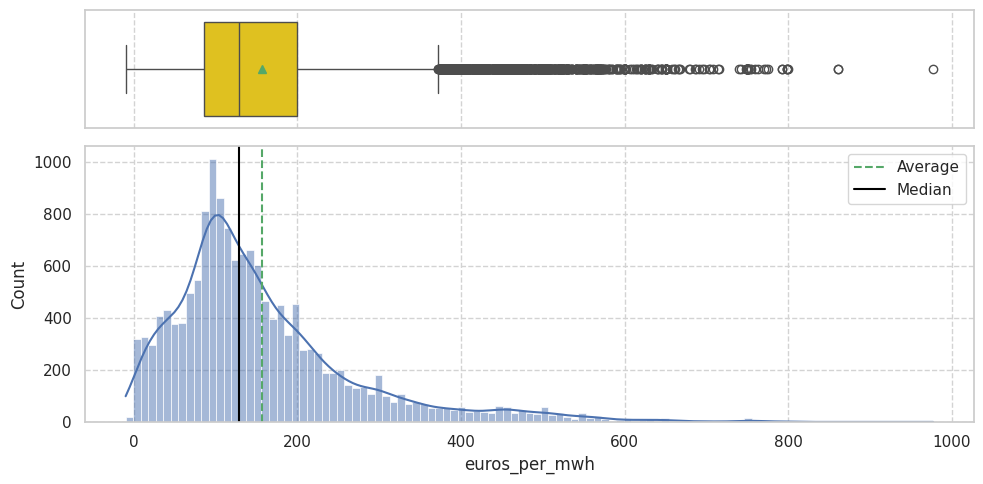

In [77]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['euros_per_mwh']
hist_plot(electricity_prices, numeric_variables_list, bins='auto')

###**10.2.3 Weather forecast**

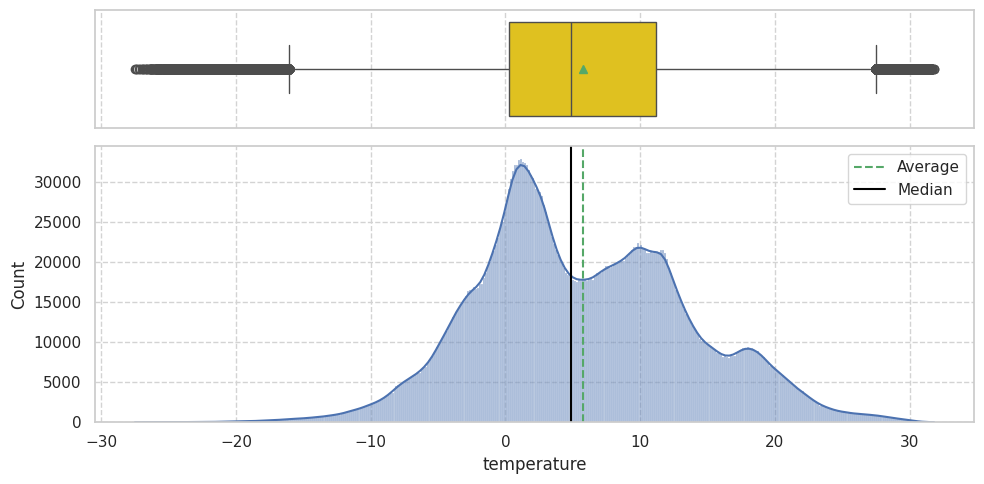

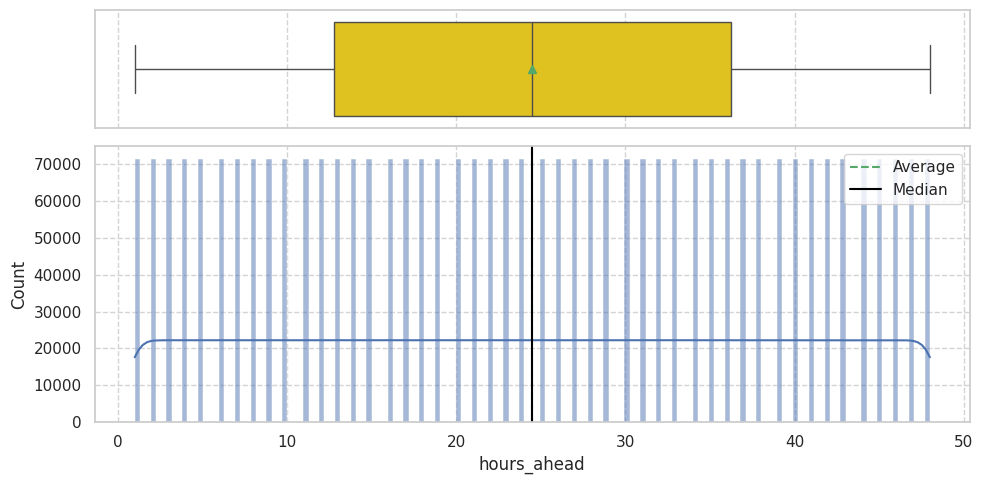

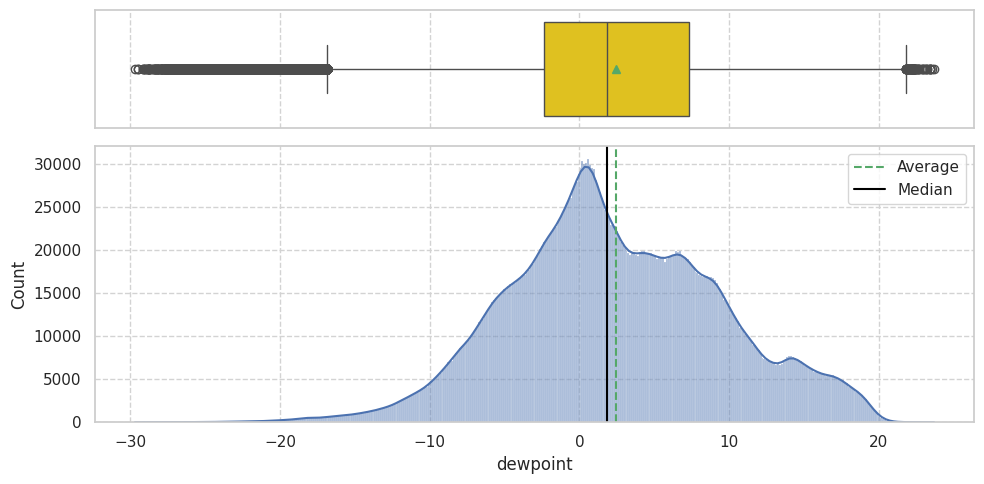

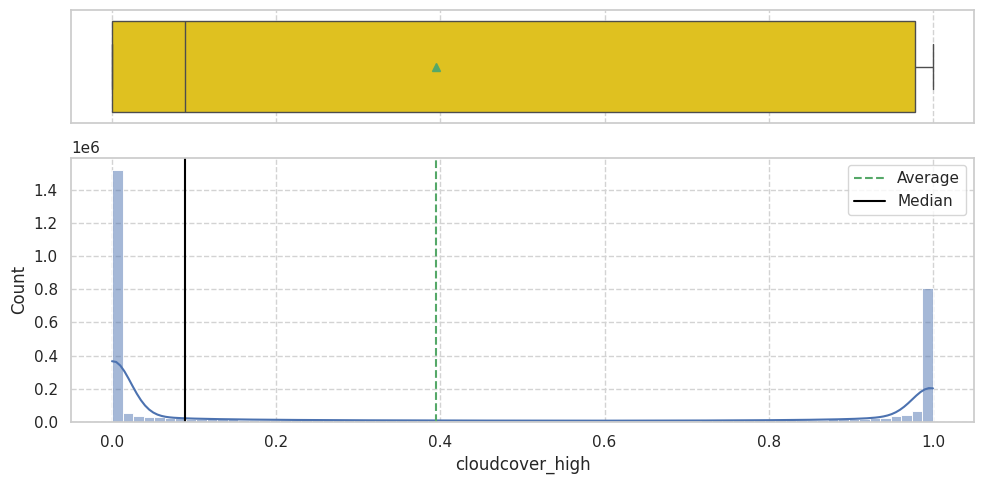

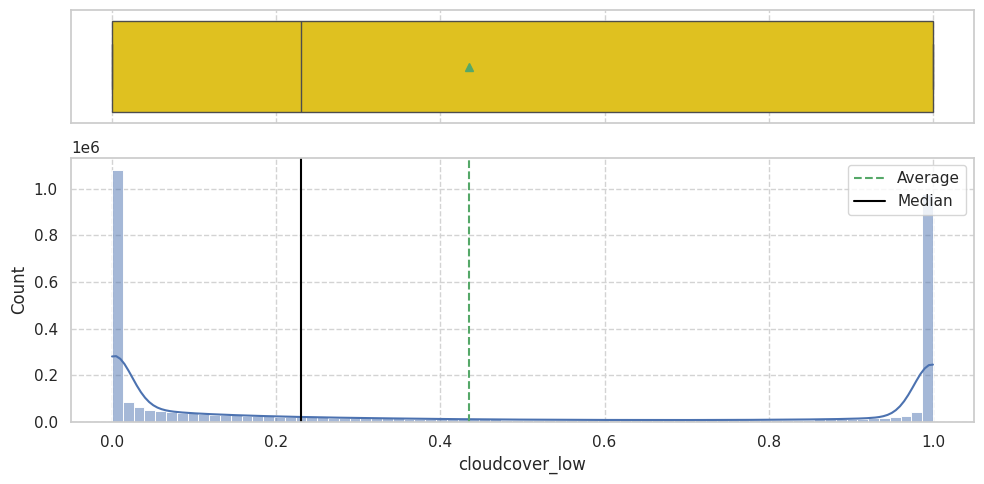

...

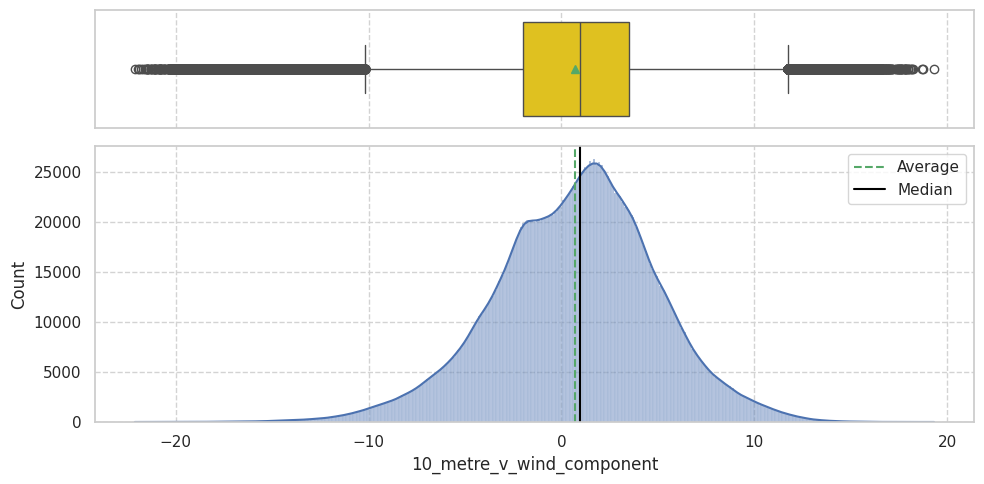

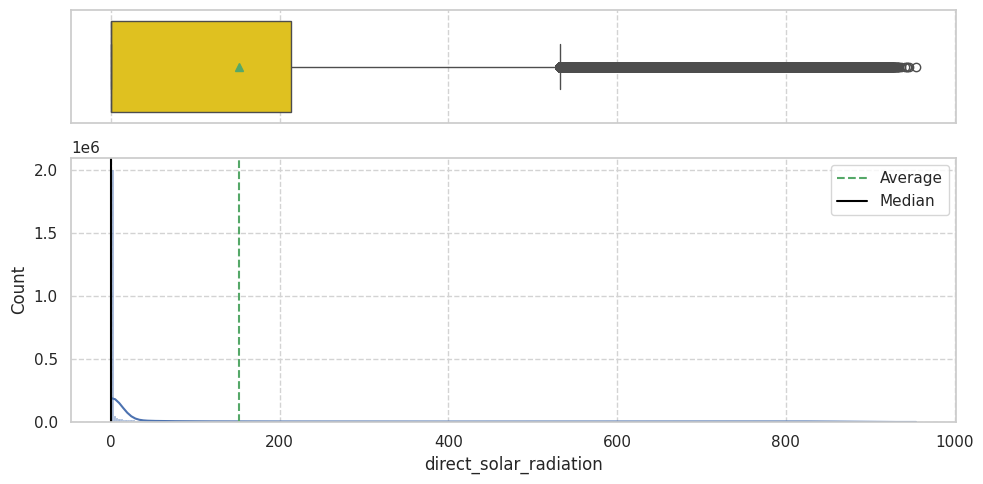

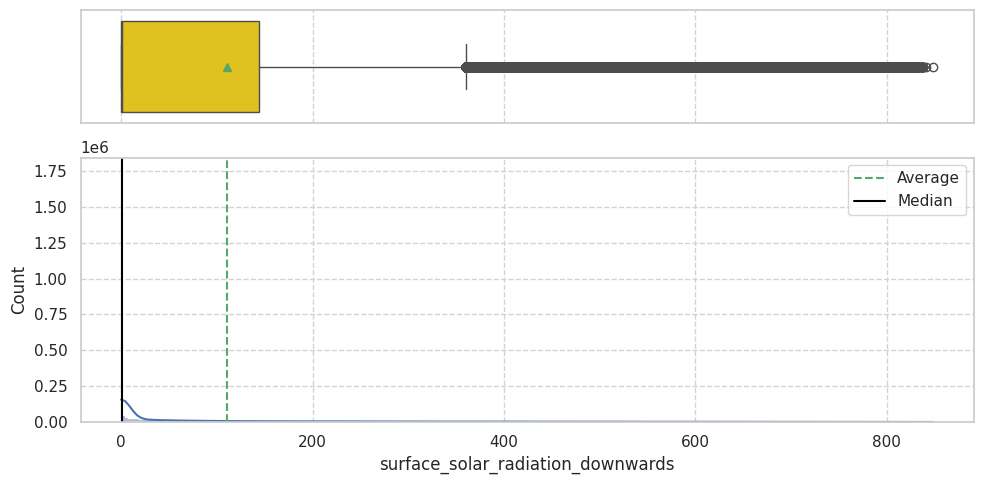

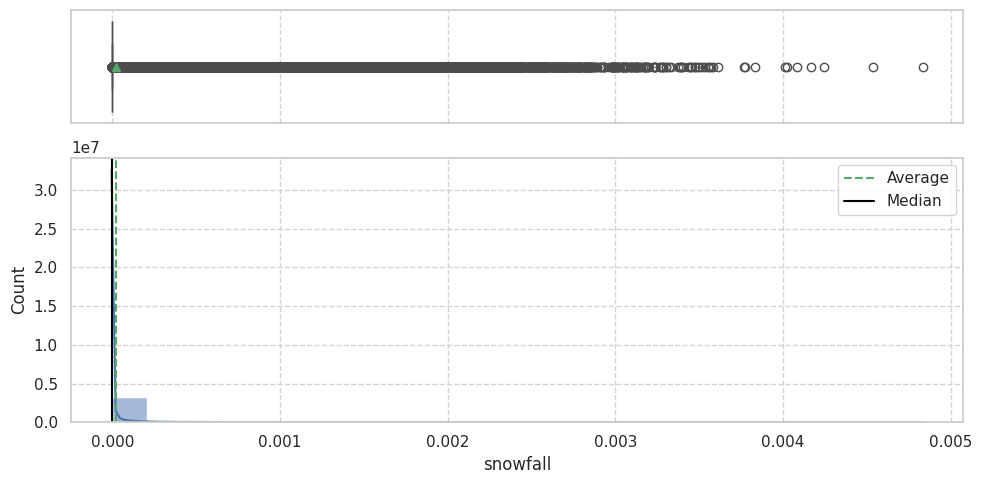

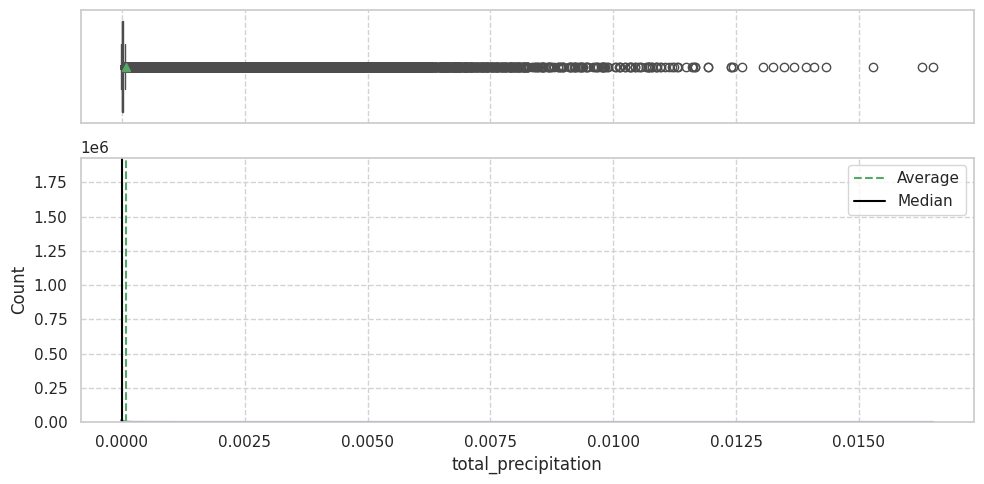

In [78]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['temperature','hours_ahead','dewpoint','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', '10_metre_u_wind_component','10_metre_v_wind_component', 'direct_solar_radiation','surface_solar_radiation_downwards','snowfall','total_precipitation']
hist_plot(forecast_weather, numeric_variables_list, bins='auto')

###**10.2.4 Gas prices**

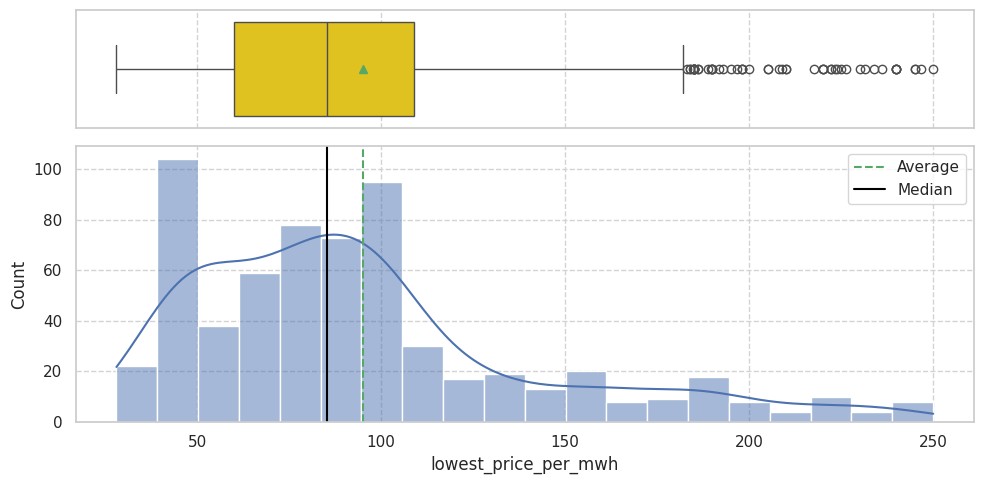

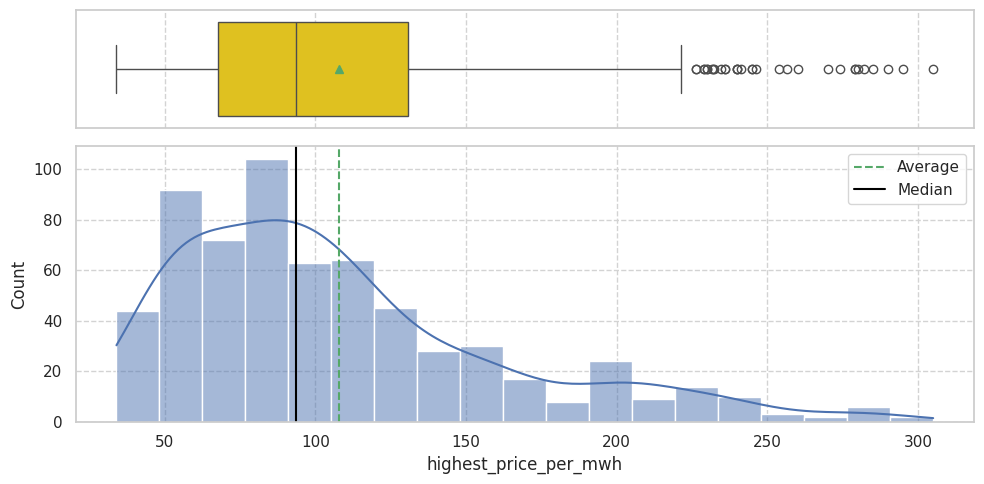

In [79]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['lowest_price_per_mwh','highest_price_per_mwh']
hist_plot(gas_prices, numeric_variables_list, bins='auto')

###**10.2.5 History**

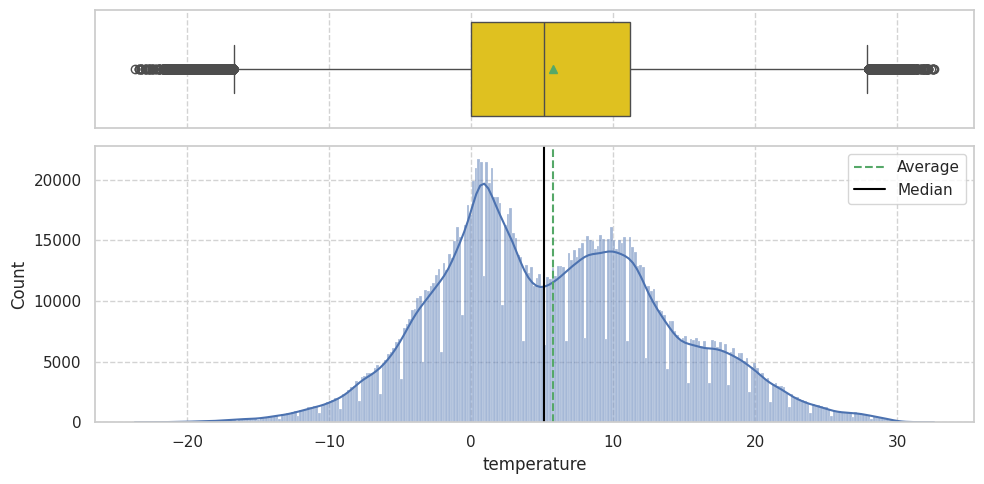

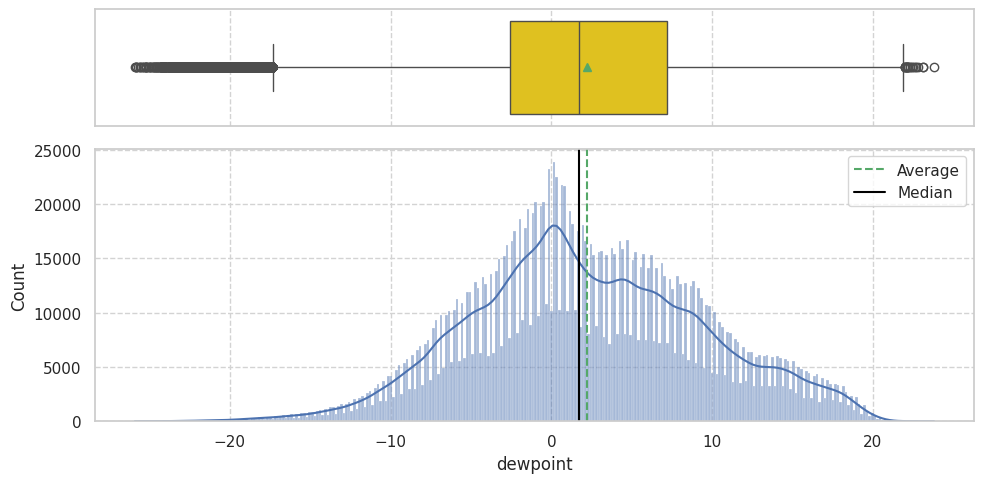

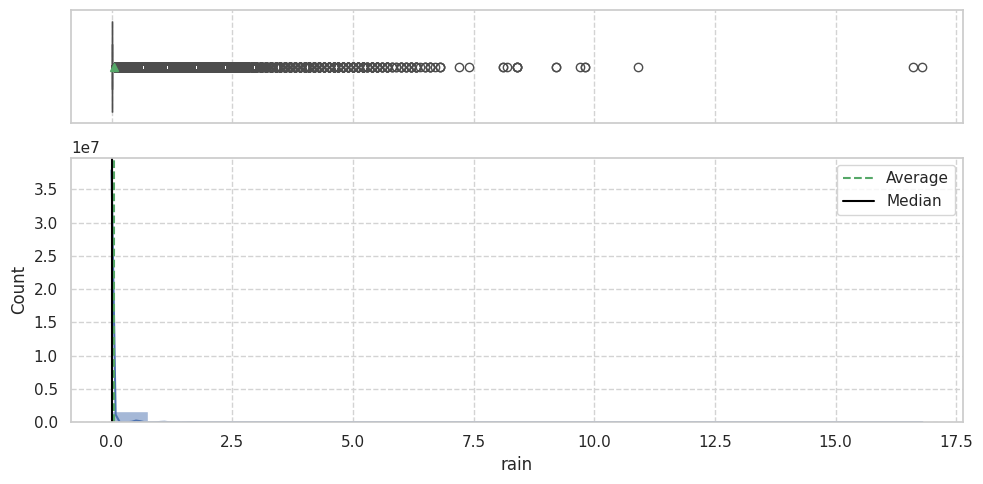

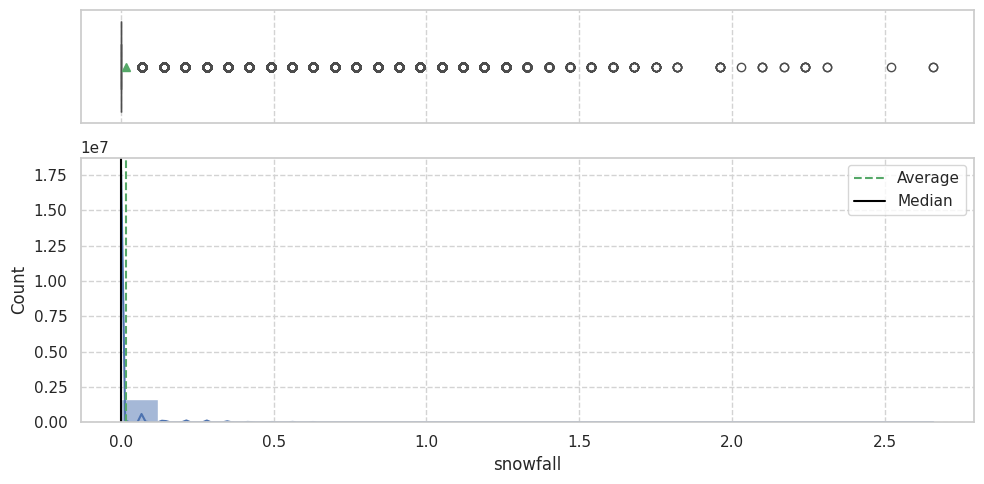

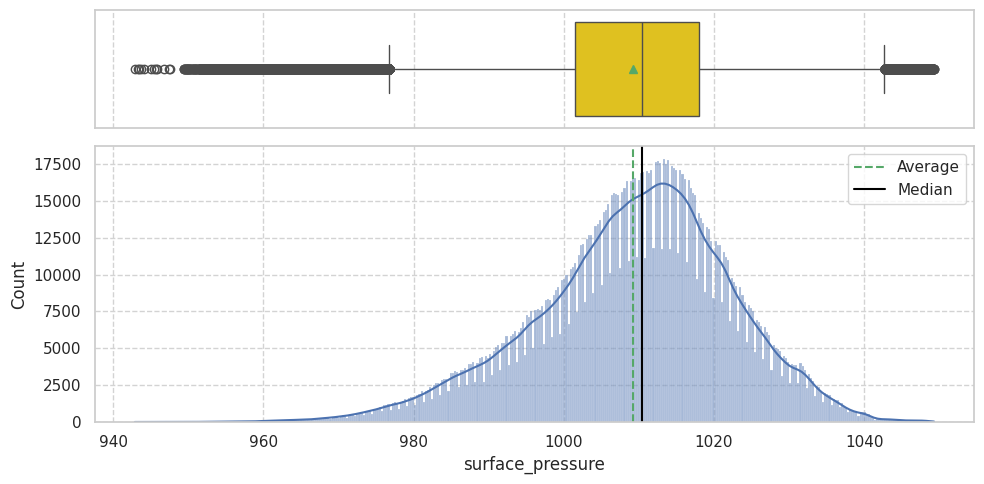

...

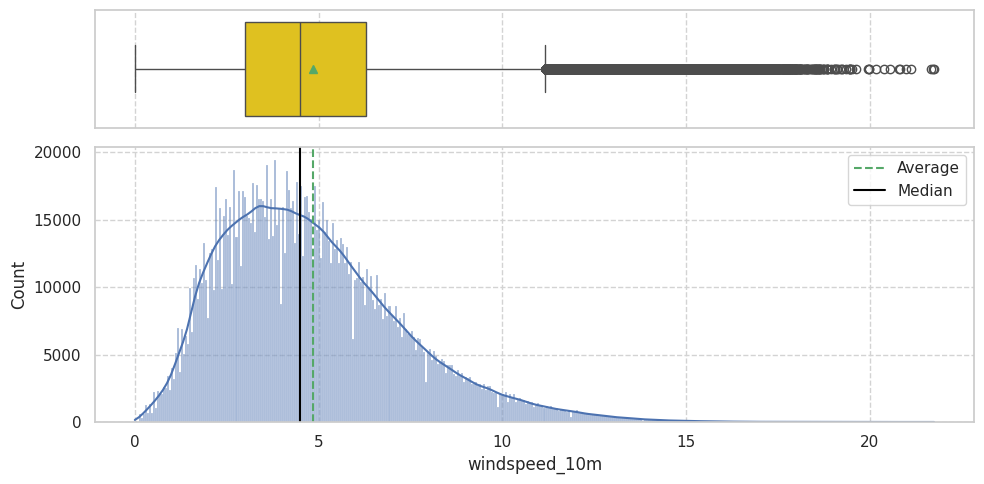

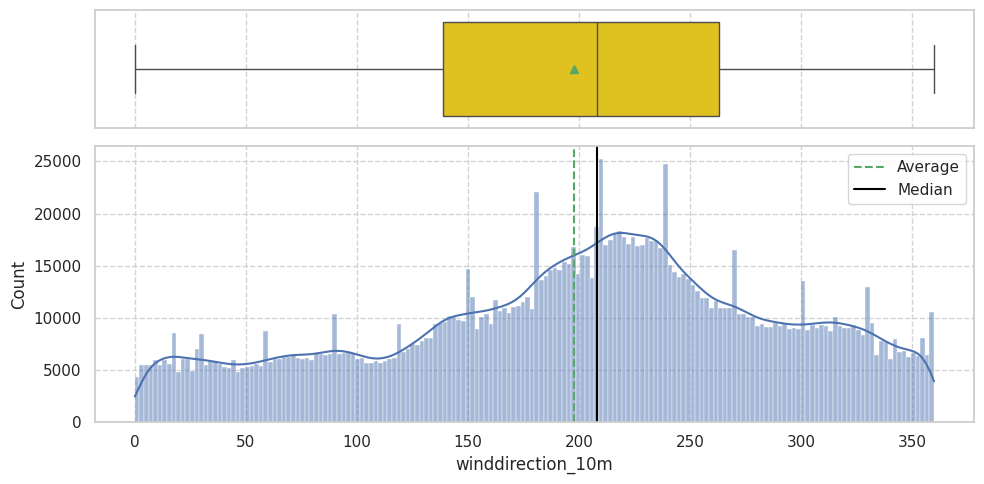

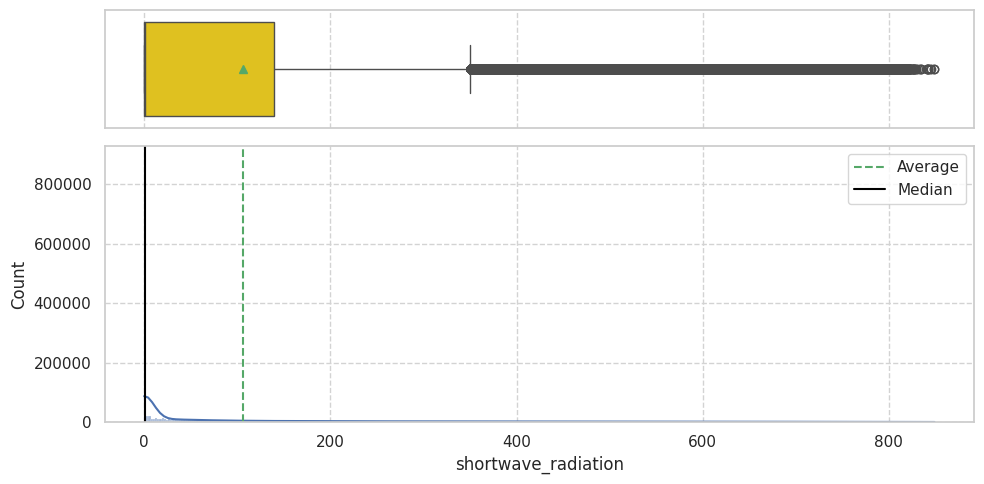

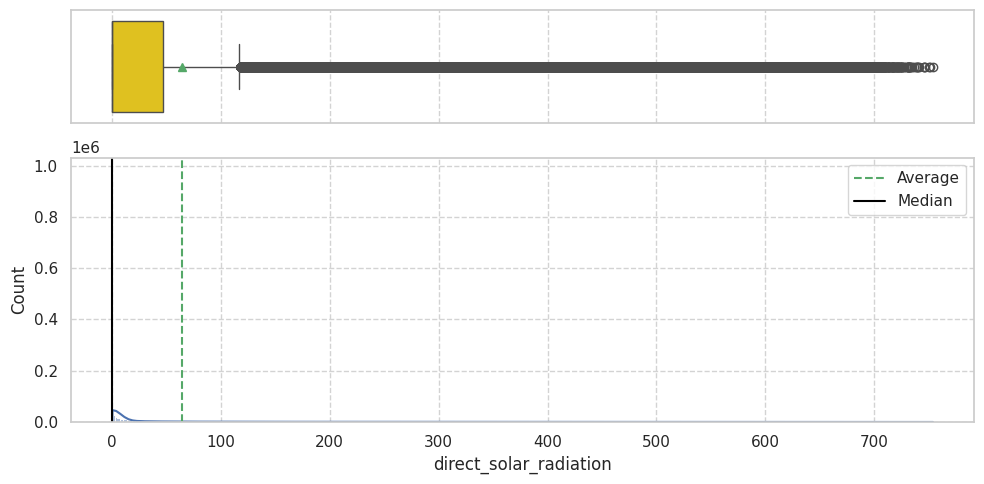

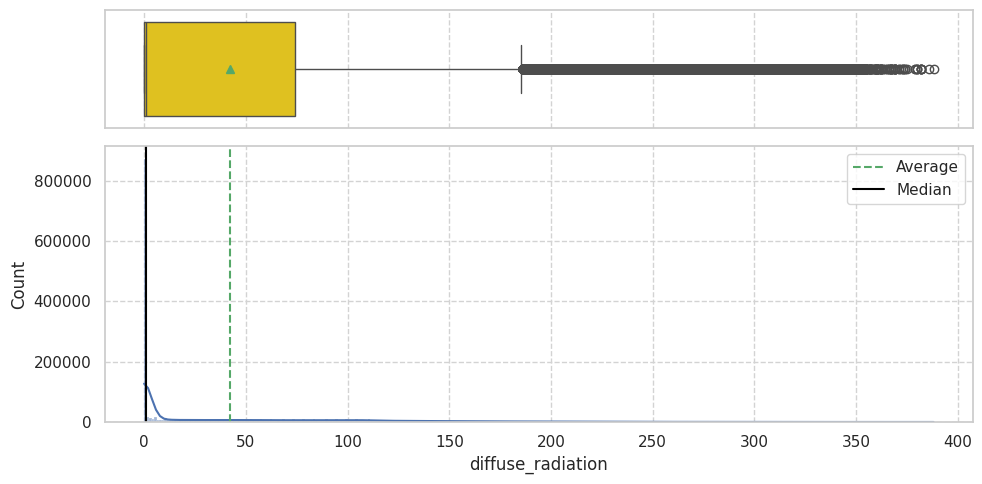

In [54]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['temperature','dewpoint','rain','snowfall','surface_pressure','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', 'windspeed_10m', 'winddirection_10m','shortwave_radiation','direct_solar_radiation','diffuse_radiation']
hist_plot(history, numeric_variables_list, bins='auto')

###**10.2.6 Data**

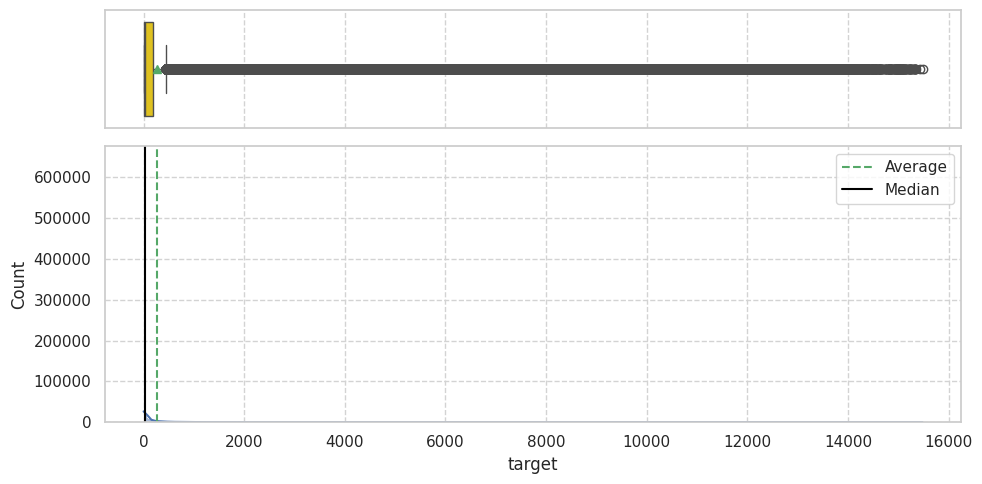

In [55]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['target']
hist_plot(data, numeric_variables_list, bins='auto')

# **11. Bivariate Analysis**

## **11.1 Function for Bivariate analyses**

In [57]:
# Function to plot stacked bar plots

def stacked_barplot(data, predictor, target):
    """
    # Print the category counts and plot a stacked bar chart
    # data: dataframe
    # predictor: independent variable
    # target: target variable
    # """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab= pd.crosstab(data[predictor], data[target])
    axs=tab.plot(kind = "bar", stacked = True, figsize = (count + 1, 5))
    plt.legend(loc = "upper left", frameon = False, bbox_to_anchor = (1, 1), title=target)
    plt.xticks(rotation=90)                                                                       # Customize the x axis labels by rotating them by 45 degrees

  #Annotate each bar chart with its percentage
    for p in axs.patches:
        ratio = '{:.1f}%'.format(100 * p.get_height() / len(data[predictor]))                           # Calculate the ratio of each category
        x = p.get_x() + p.get_width() / 2                                                         # Determine the x coordinate of the annotation text
        y = p.get_y() + p.get_height()                                                            # Determine the y coordinate of the annotation text
        axs.annotate(ratio, (x, y), size = 7)                                                      # Display the ratio on top of each bar


    plt.show()

## **11.2 Correlation analysis with heatmap**

###**11.2.1 Weather forecast**

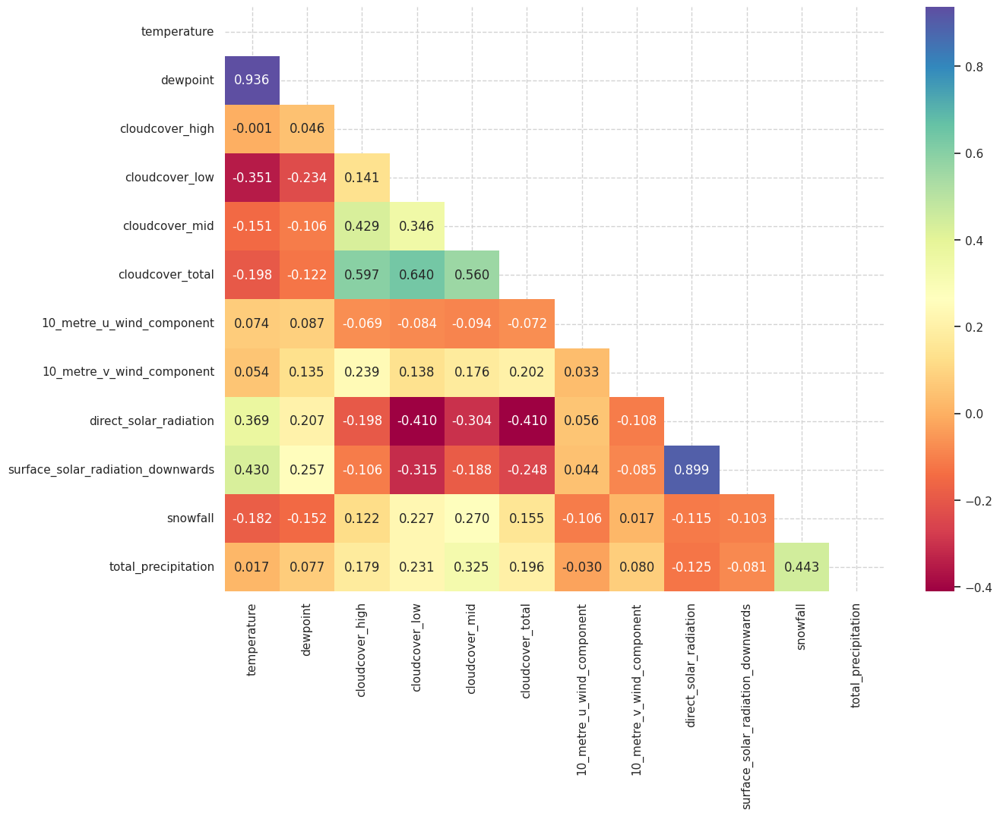

In [58]:

# Finding the linear correlations between the numerical variables of the dataset
num_var = ['temperature','dewpoint','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', '10_metre_u_wind_component','10_metre_v_wind_component', 'direct_solar_radiation','surface_solar_radiation_downwards','snowfall','total_precipitation']

corrmat = forecast_weather[num_var].corr()

# Plot the correlation heatmap
plt.figure(figsize = (14, 10))
sns.heatmap(corrmat, annot = True, cmap = 'Spectral',
        fmt = ".3f",
        xticklabels = corrmat.columns,
        yticklabels = corrmat.columns,
        mask=np.triu(corrmat))
plt.xticks(rotation = 90);



###**11.2.2 History**

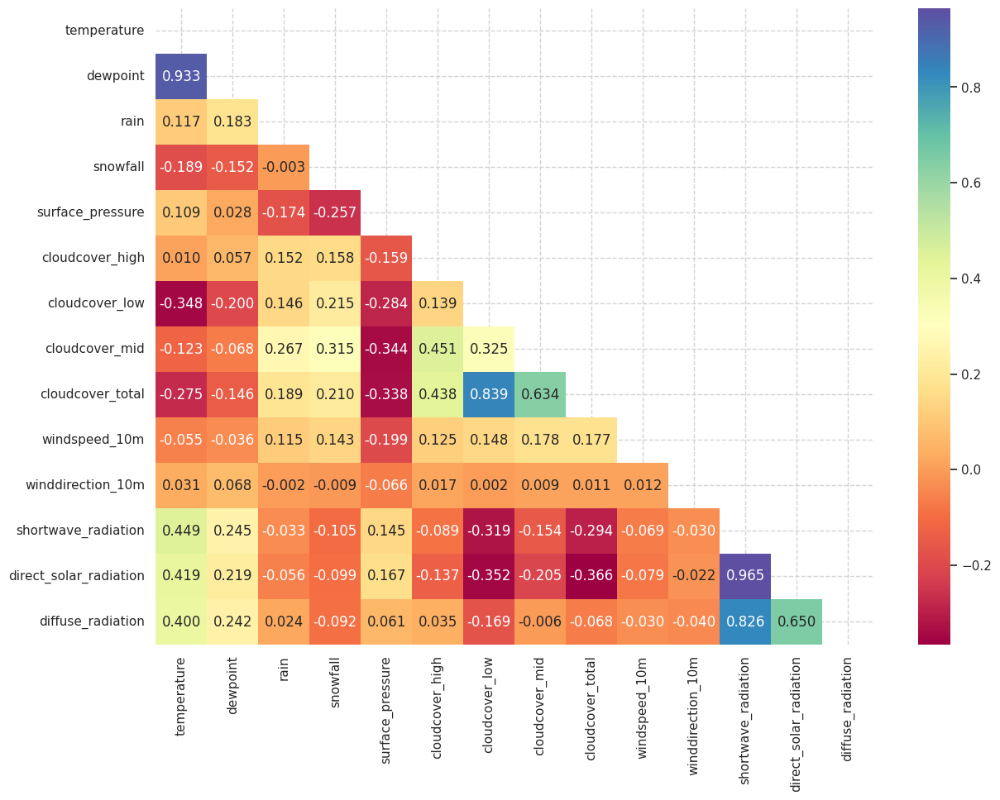

In [59]:

# Finding the linear correlations between the numerical variables of the dataset
num_var = ['temperature','dewpoint','rain','snowfall','surface_pressure','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', 'windspeed_10m', 'winddirection_10m','shortwave_radiation','direct_solar_radiation','diffuse_radiation']

corrmat = history[num_var].corr()

# Plot the correlation heatmap
plt.figure(figsize = (14, 10))
sns.heatmap(corrmat, annot = True, cmap = 'Spectral',
        fmt = ".3f",
        xticklabels = corrmat.columns,
        yticklabels = corrmat.columns,
        mask=np.triu(corrmat))
plt.xticks(rotation = 90);



## **11.3 Correlation analysis with boxplot and lineplot**

###**11.3.1 Clients**

<Axes: xlabel='date', ylabel='eic_count'>

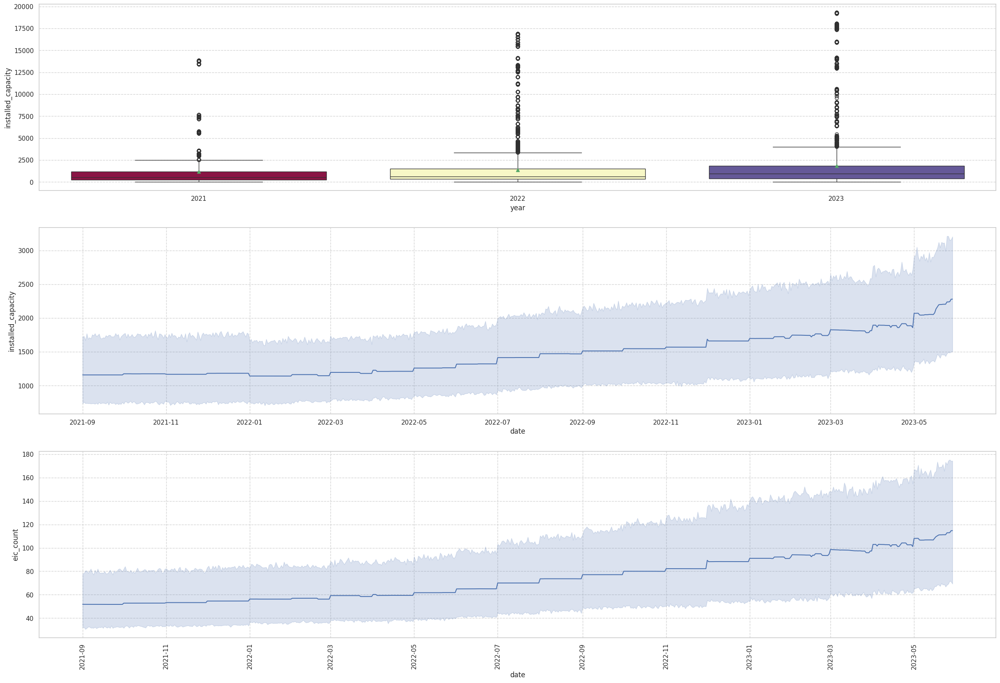

In [85]:
fig, axes = plt.subplots(3, figsize=(30, 20))
plt.xticks(rotation=90)
sns.boxplot(data=clients, x='year', y='installed_capacity', ax=axes[0],showmeans=True, showfliers = True, hue='year', palette='Spectral', legend=False)
sns.lineplot(data=clients, x='date', y='installed_capacity', ax=axes[1])
sns.lineplot(data=clients, x='date', y='eic_count', ax=axes[2])

###**11.3.2 Electricity prices**

<Axes: xlabel='origin_date', ylabel='euros_per_mwh'>

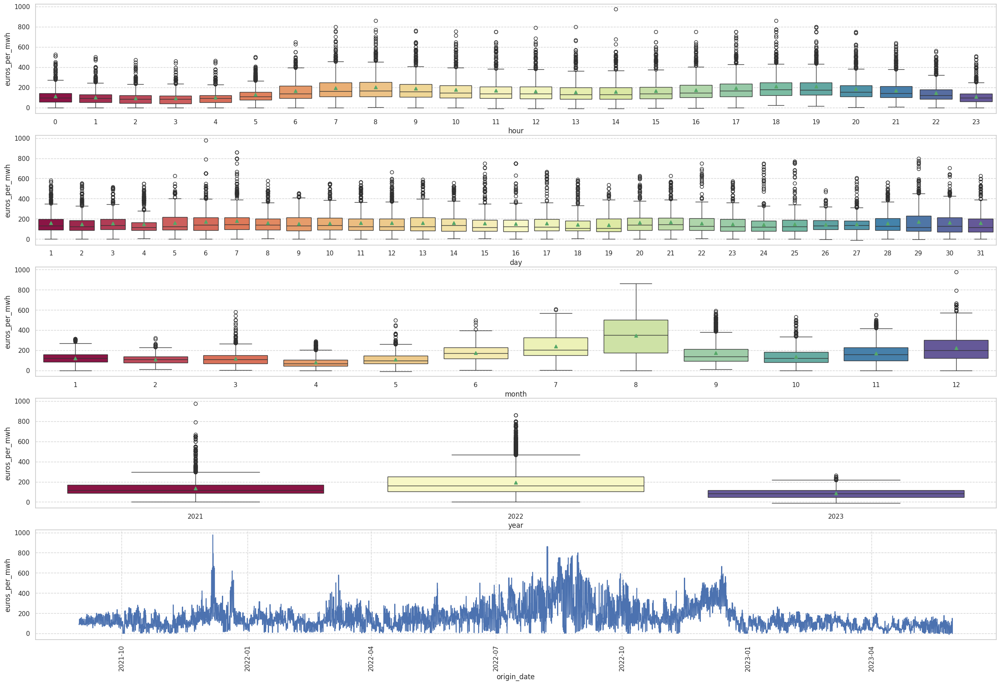

In [60]:
fig, axes = plt.subplots(5, figsize=(30, 20))
plt.xticks(rotation=90)
sns.boxplot(data=electricity_prices, x='hour', y='euros_per_mwh', ax=axes[0],showmeans=True, showfliers = True, hue='hour', palette='Spectral', legend=False)
sns.boxplot(data=electricity_prices, x='day', y='euros_per_mwh', ax=axes[1],showmeans=True, showfliers = True, hue='day', palette='Spectral', legend=False)
sns.boxplot(data=electricity_prices, x='month', y='euros_per_mwh', ax=axes[2],showmeans=True, showfliers = True, hue='month', palette='Spectral', legend=False)
sns.boxplot(data=electricity_prices, x='year', y='euros_per_mwh', ax=axes[3],showmeans=True, showfliers = True, hue='year', palette='Spectral', legend=False)
sns.lineplot(data=electricity_prices, x='origin_date', y='euros_per_mwh', ax=axes[4])


###**11.3.3 Weather forecast**

<ipython-input-63-9bed79863dc0>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(figsize=(20, 10))


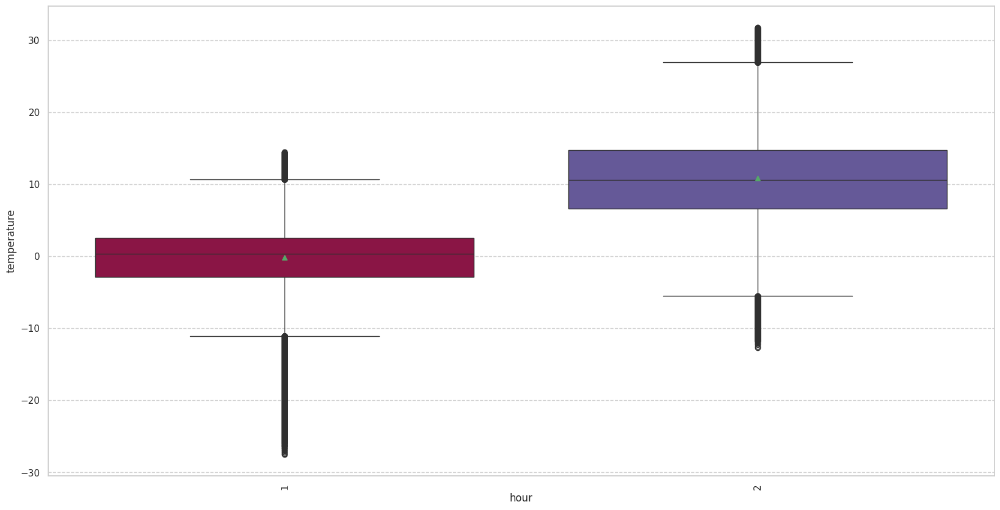

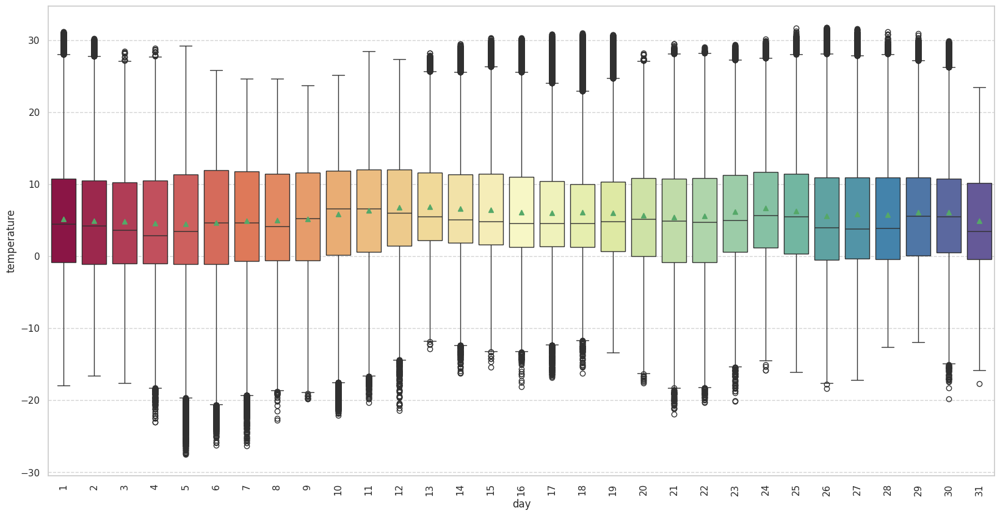

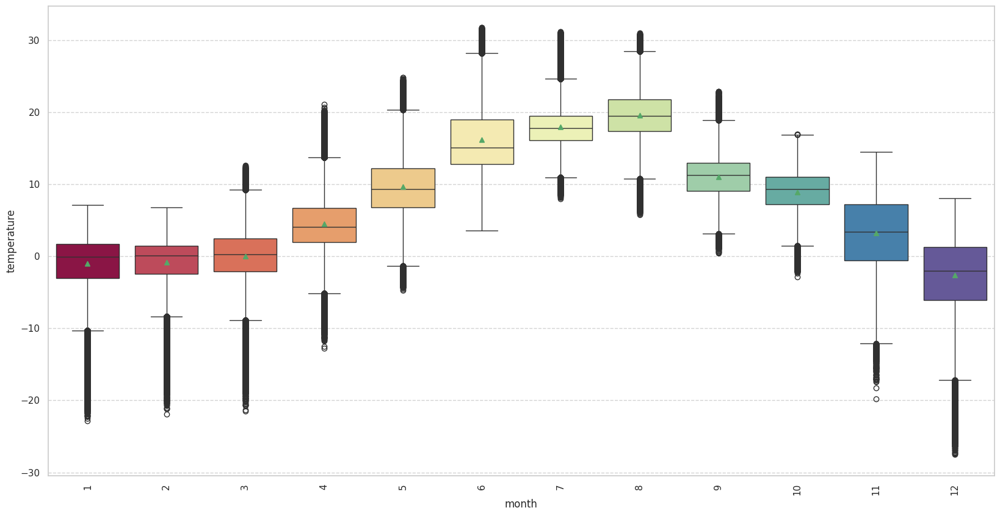

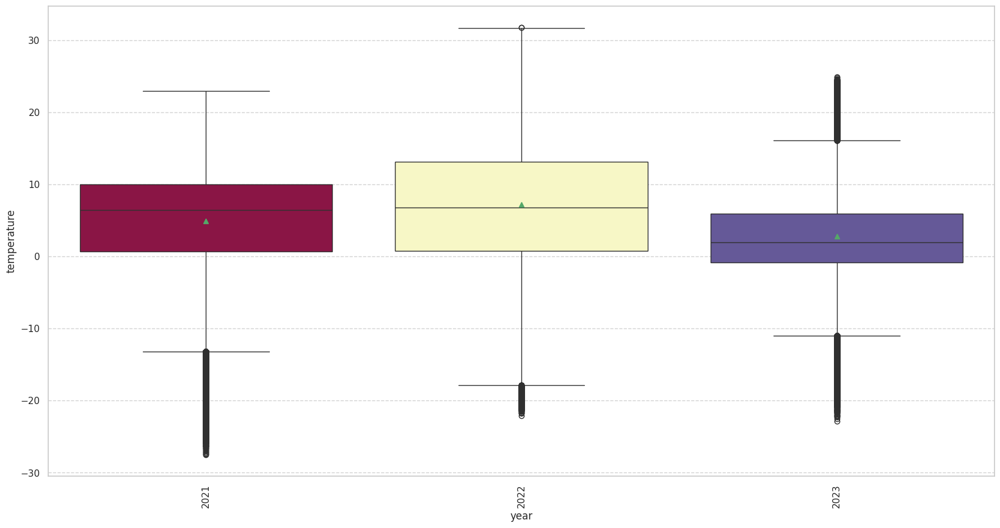

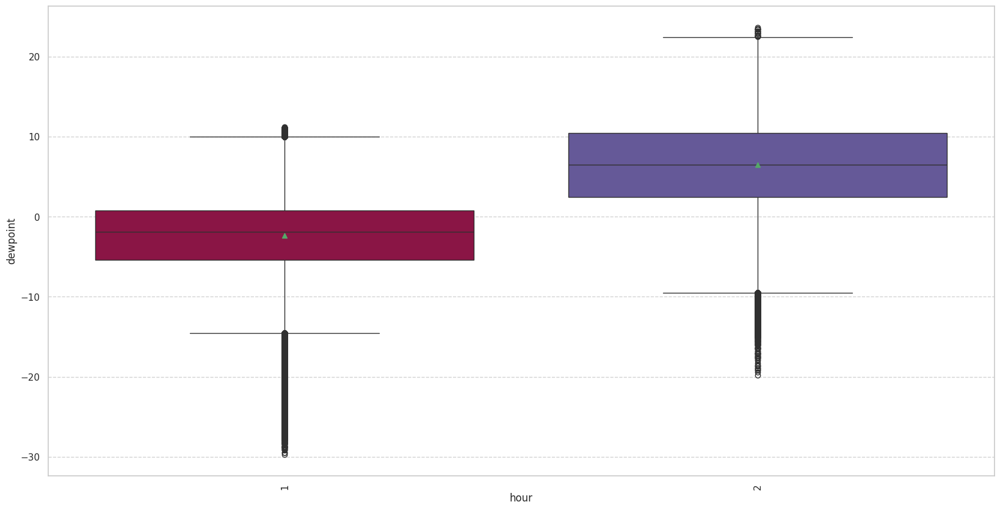

...

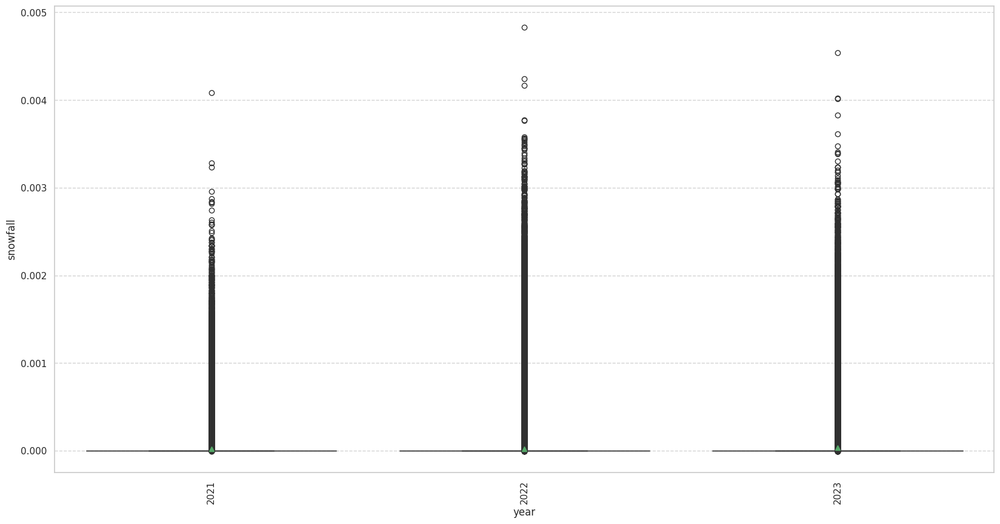

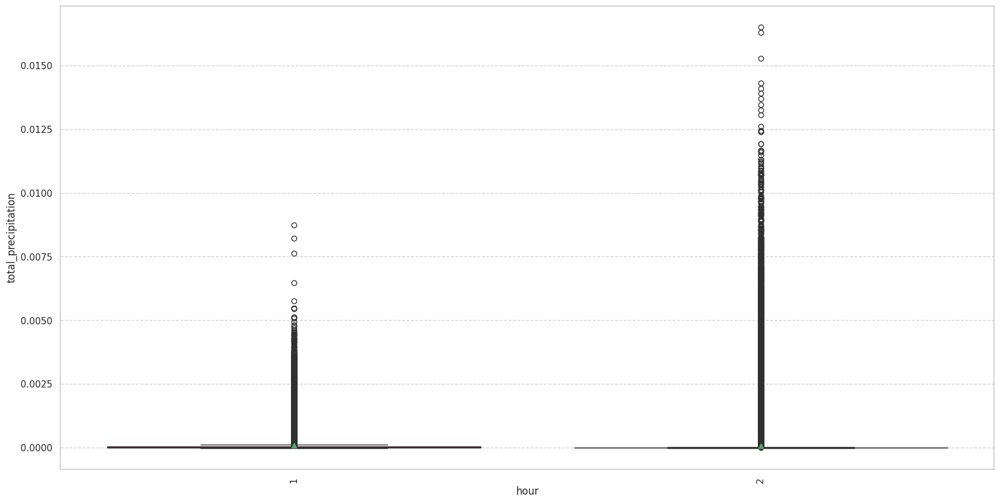

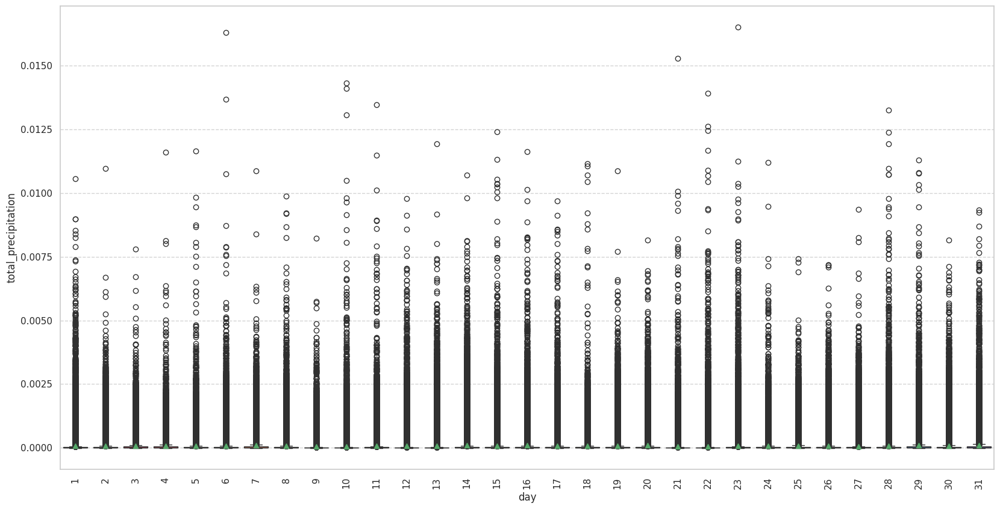

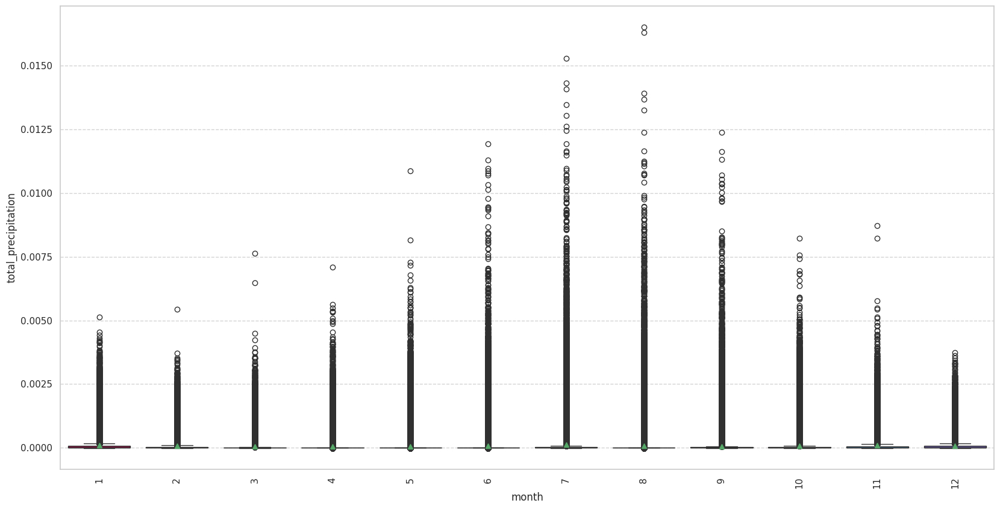

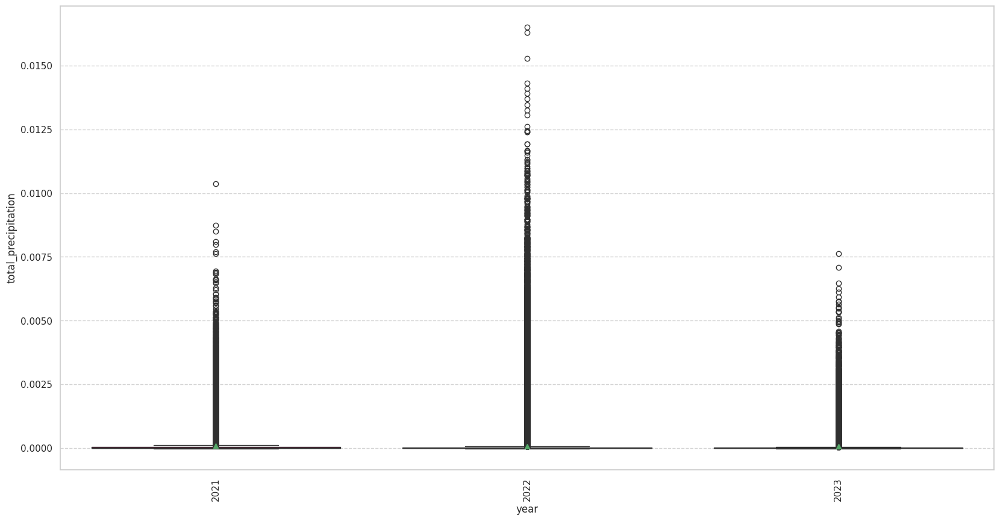

In [63]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['temperature','dewpoint','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', '10_metre_u_wind_component','10_metre_v_wind_component', 'direct_solar_radiation','surface_solar_radiation_downwards','snowfall','total_precipitation']

tim_rge = ['hour','day','month','year']
for idx, var in enumerate(numeric_variables_list):
    for t_i in tim_rge:
      fig, axes = plt.subplots(figsize=(20, 10))
      sns.boxplot(data=forecast_weather, x=t_i, y=var, showmeans=True, showfliers = True, hue=t_i, palette='Spectral', legend=False, ax=axes)
      plt.xticks(rotation=90)

# for idx, var in enumerate(numeric_variables_list):
#   fig, axes = plt.subplots(figsize=(20, 10))
#   sns.lineplot(data=forecast_weather, x='origin_datetime', y=var, ax=axes)
#   plt.xticks(rotation=90)



###**11.3.4 Gas prices**

<Axes: xlabel='origin_date', ylabel='highest_price_per_mwh'>

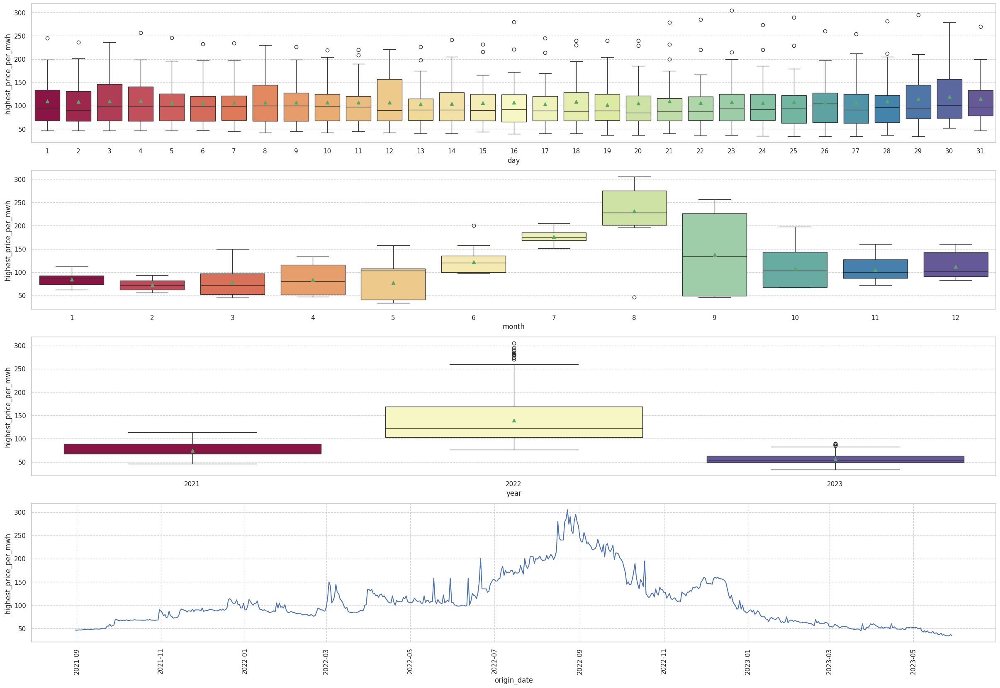

In [64]:
fig, axes = plt.subplots(4, figsize=(30, 20))
plt.xticks(rotation=90)
sns.boxplot(data=gas_prices, x='day', y='highest_price_per_mwh', ax=axes[0],showmeans=True, showfliers = True, hue='day', palette='Spectral', legend=False)
sns.boxplot(data=gas_prices, x='month', y='highest_price_per_mwh', ax=axes[1],showmeans=True, showfliers = True, hue='month', palette='Spectral', legend=False)
sns.boxplot(data=gas_prices, x='year', y='highest_price_per_mwh', ax=axes[2],showmeans=True, showfliers = True, hue='year', palette='Spectral', legend=False)
sns.lineplot(data=gas_prices, x='origin_date', y='highest_price_per_mwh', ax=axes[3])


<Axes: xlabel='origin_date', ylabel='lowest_price_per_mwh'>

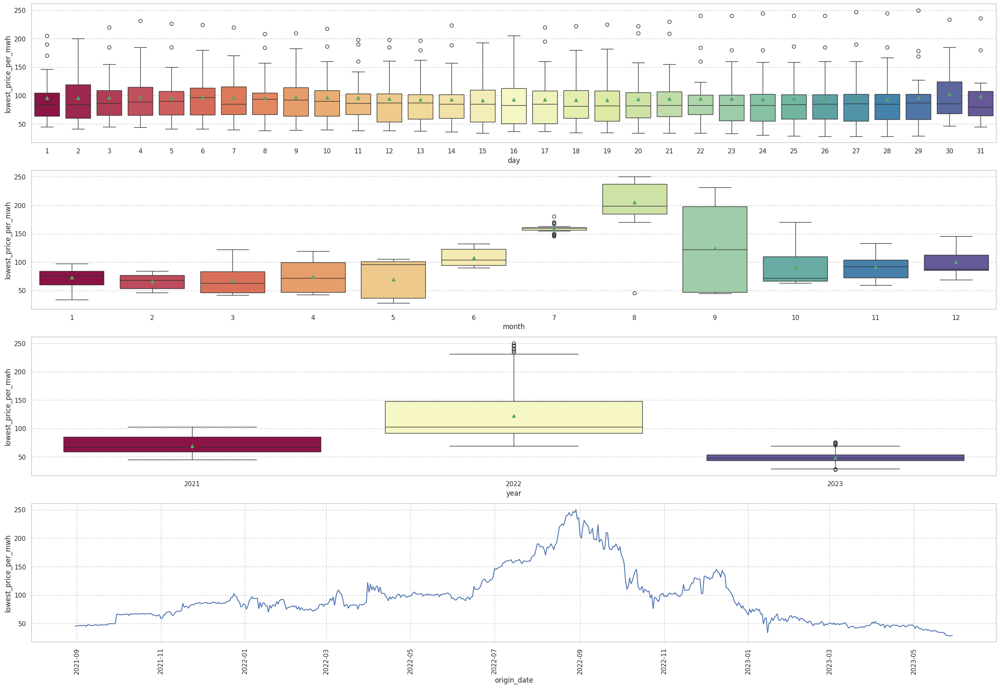

In [65]:
fig, axes = plt.subplots(4, figsize=(30, 20))
plt.xticks(rotation=90)
sns.boxplot(data=gas_prices, x='day', y='lowest_price_per_mwh', ax=axes[0],showmeans=True, showfliers = True, hue='day', palette='Spectral', legend=False)
sns.boxplot(data=gas_prices, x='month', y='lowest_price_per_mwh', ax=axes[1],showmeans=True, showfliers = True, hue='month', palette='Spectral', legend=False)
sns.boxplot(data=gas_prices, x='year', y='lowest_price_per_mwh', ax=axes[2],showmeans=True, showfliers = True, hue='year', palette='Spectral', legend=False)
sns.lineplot(data=gas_prices, x='origin_date', y='lowest_price_per_mwh', ax=axes[3])


###**11.3.5 History**

<ipython-input-67-41d3575007a7>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(figsize=(20, 10))


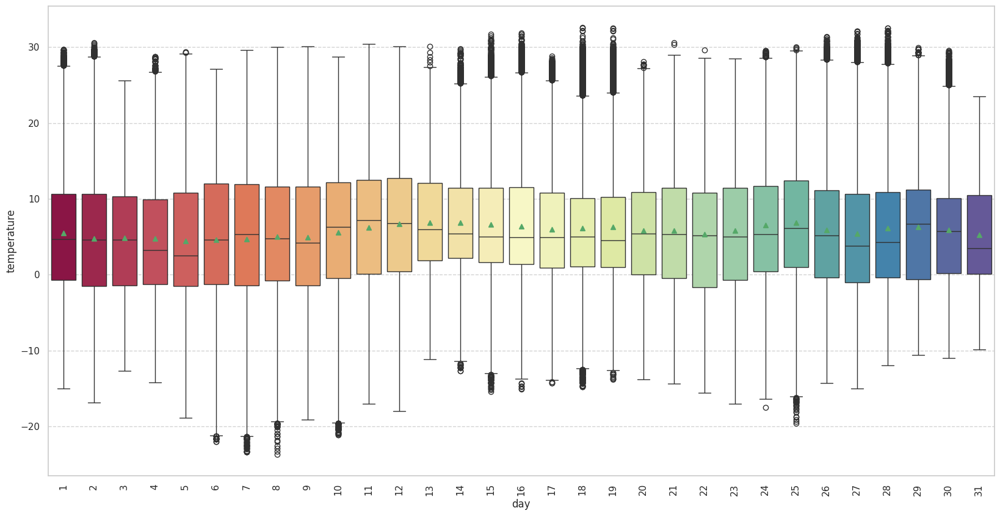

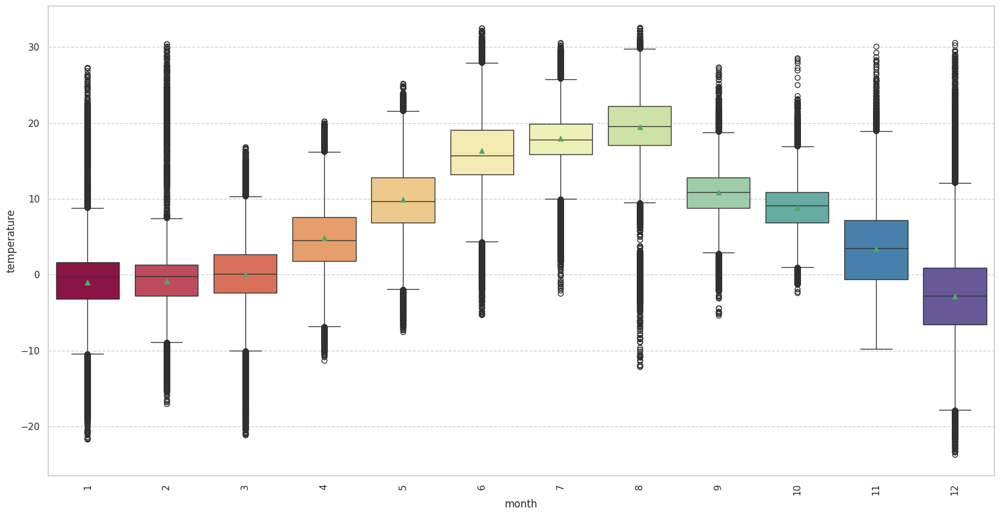

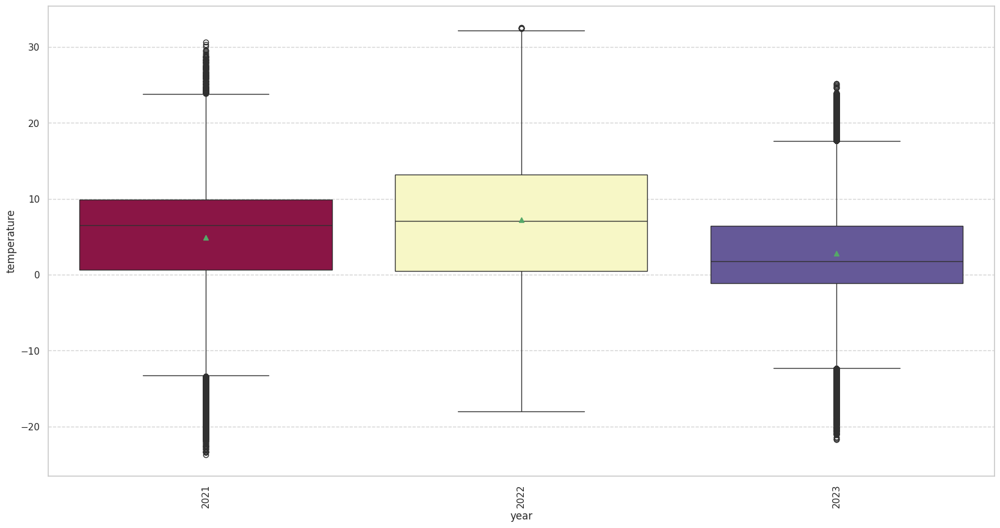

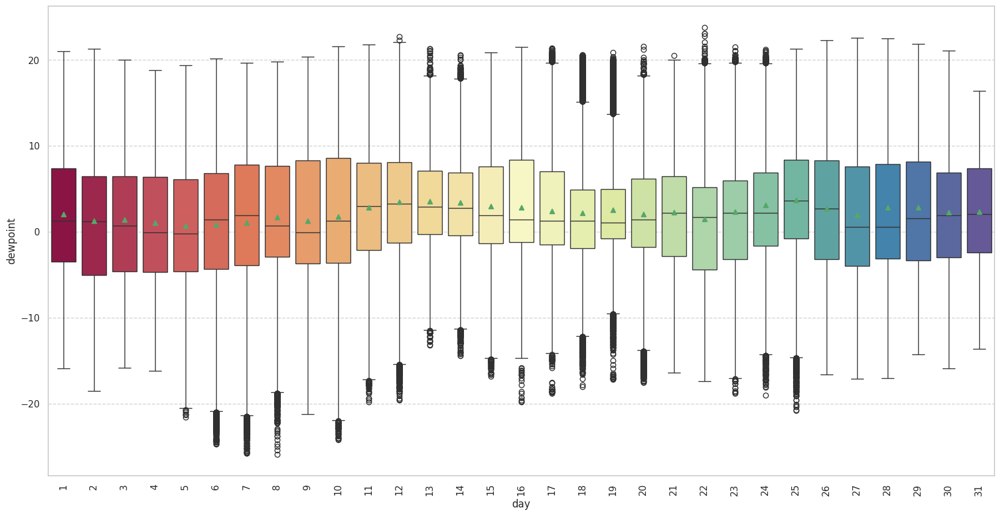

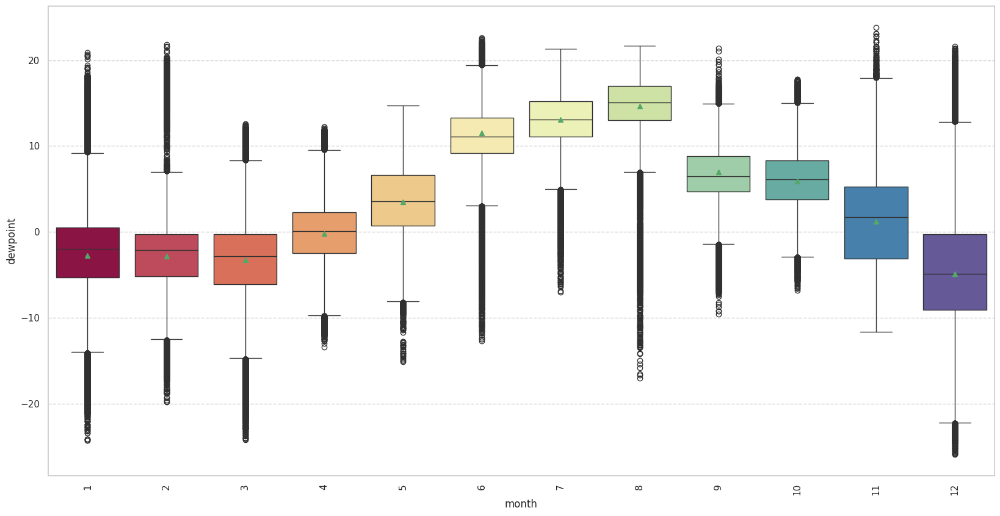

...

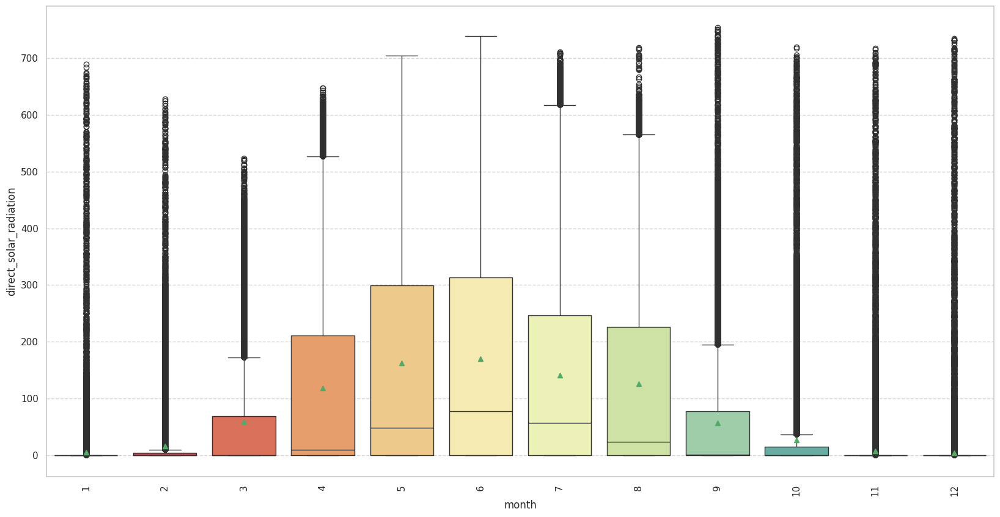

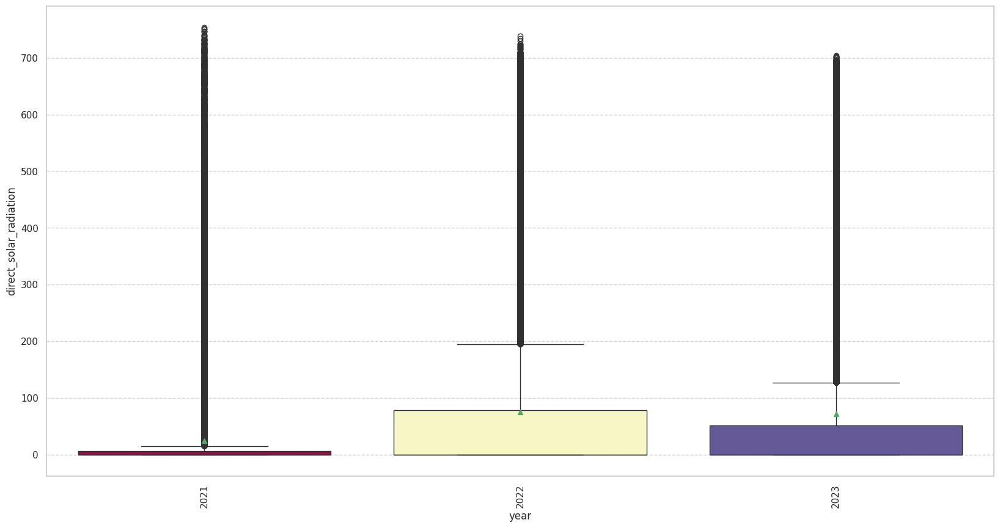

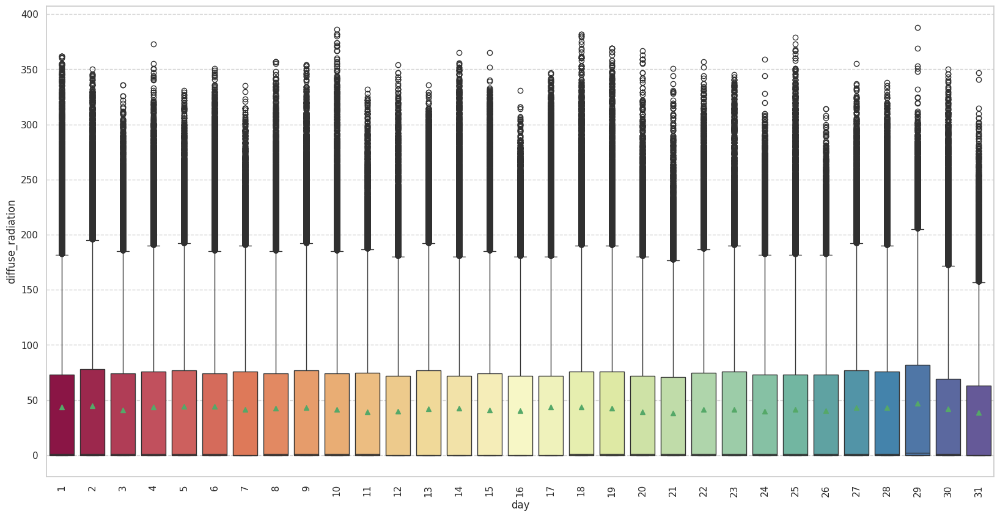

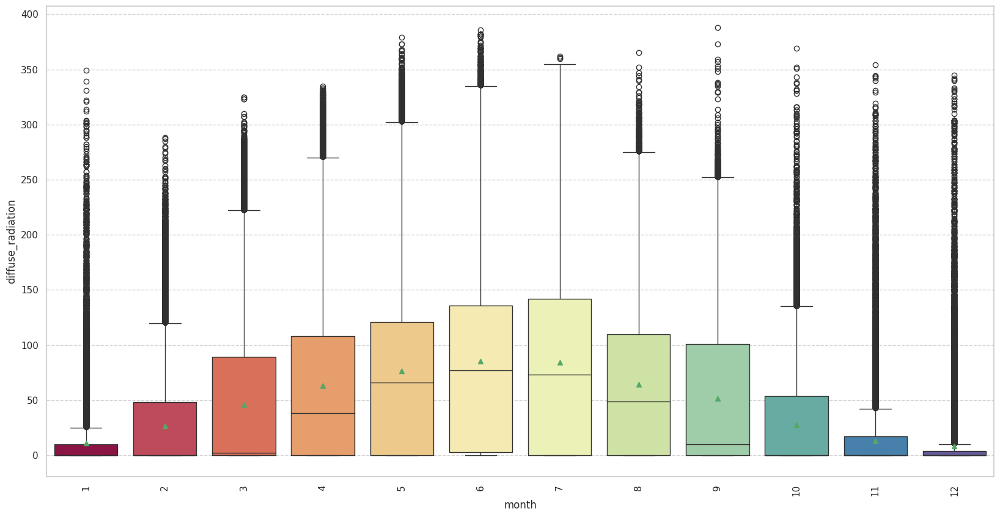

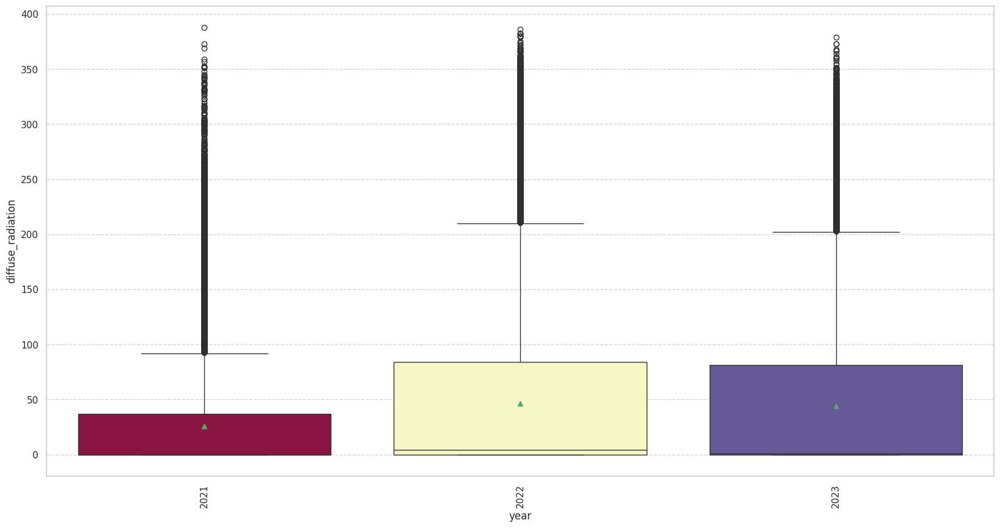

In [67]:
# Let's plot the distribution of the relevant features
numeric_variables_list = ['temperature','dewpoint','rain','snowfall','surface_pressure','cloudcover_high','cloudcover_low','cloudcover_mid','cloudcover_total', 'windspeed_10m', 'winddirection_10m','shortwave_radiation','direct_solar_radiation','diffuse_radiation']
tim_rge = ['day','month','year']
for idx, var in enumerate(numeric_variables_list):
    for t_i in tim_rge:
      fig, axes = plt.subplots(figsize=(20, 10))
      sns.boxplot(data=history, x=t_i, y=var, showmeans=True, showfliers = True, hue=t_i, palette='Spectral', legend=False, ax=axes)
      plt.xticks(rotation=90)

# for idx, var in enumerate(numeric_variables_list):
#   fig, axes = plt.subplots(figsize=(20, 10))
#   sns.lineplot(data=history, x='datetime', y=var, ax=axes)
#   plt.xticks(rotation=90)


###**11.3.6 Data**

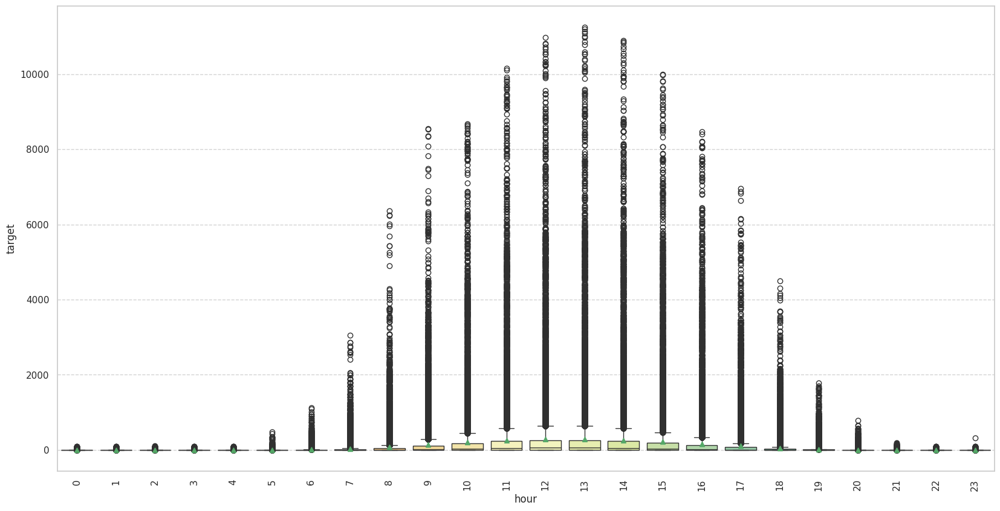

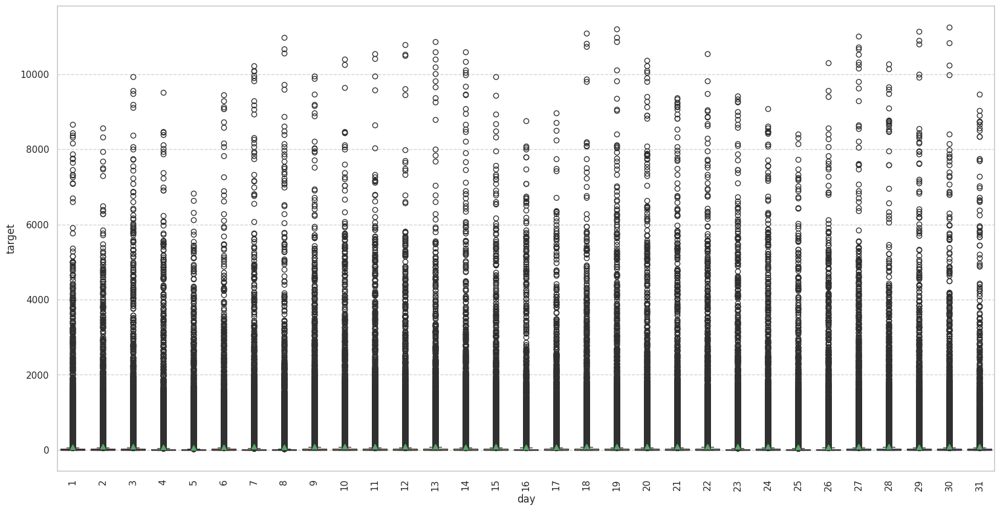

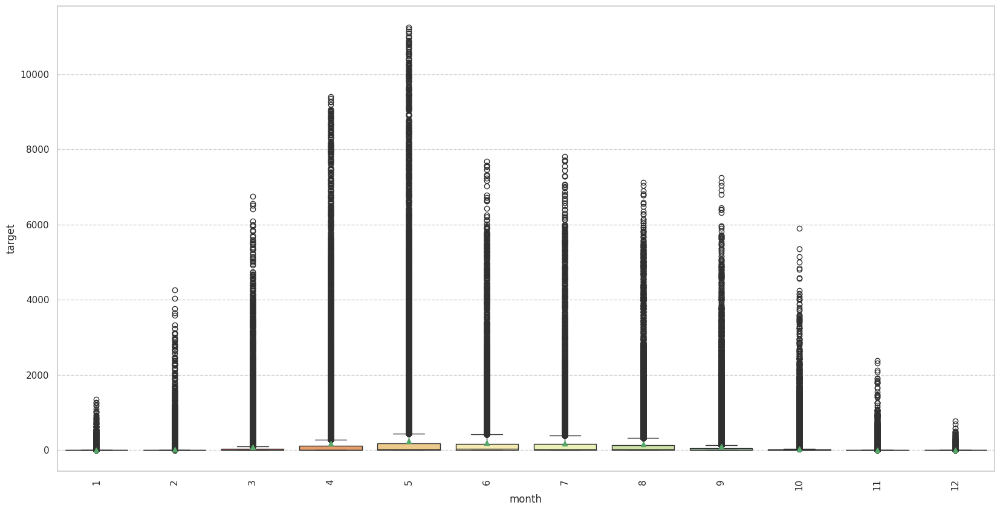

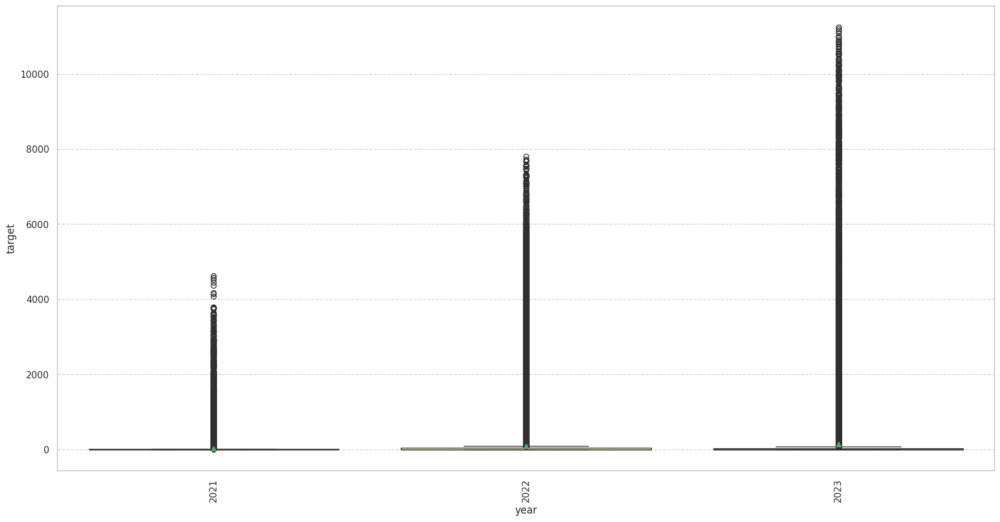

In [68]:
# Let's plot the production evolution
numeric_variables_list = ['target']
tim_rge = ['hour','day','month','year']
for idx, var in enumerate(numeric_variables_list):
    for t_i in tim_rge:
      fig, axes = plt.subplots(figsize=(20, 10))
      sns.boxplot(data=data[data['is_consumption']==0], x=t_i, y=var, showmeans=True, showfliers = True, hue=t_i, palette='Spectral', ax=axes, legend=False)
      plt.xticks(rotation=90)

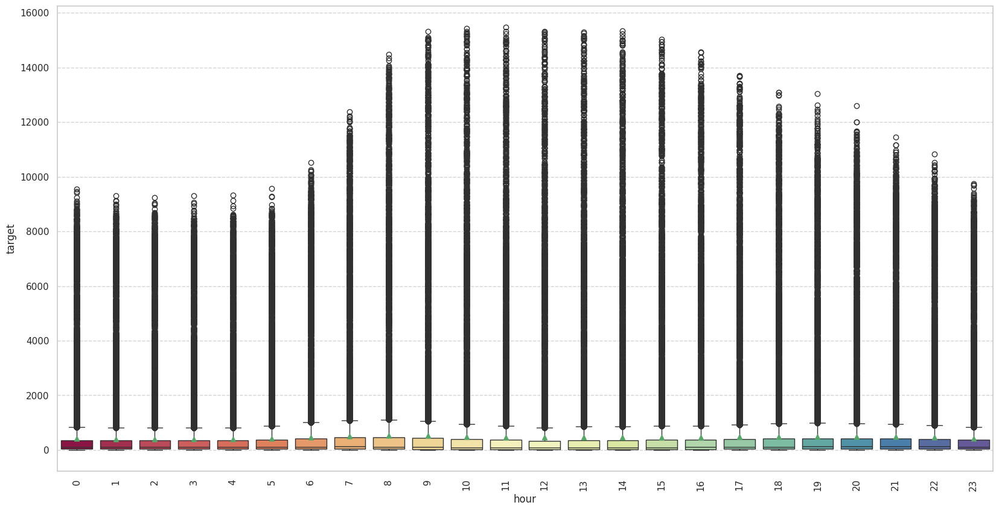

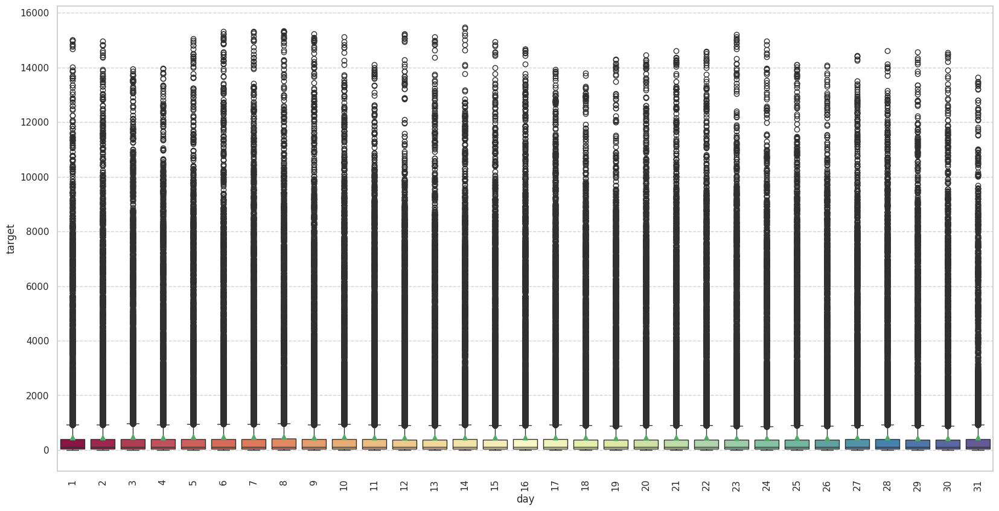

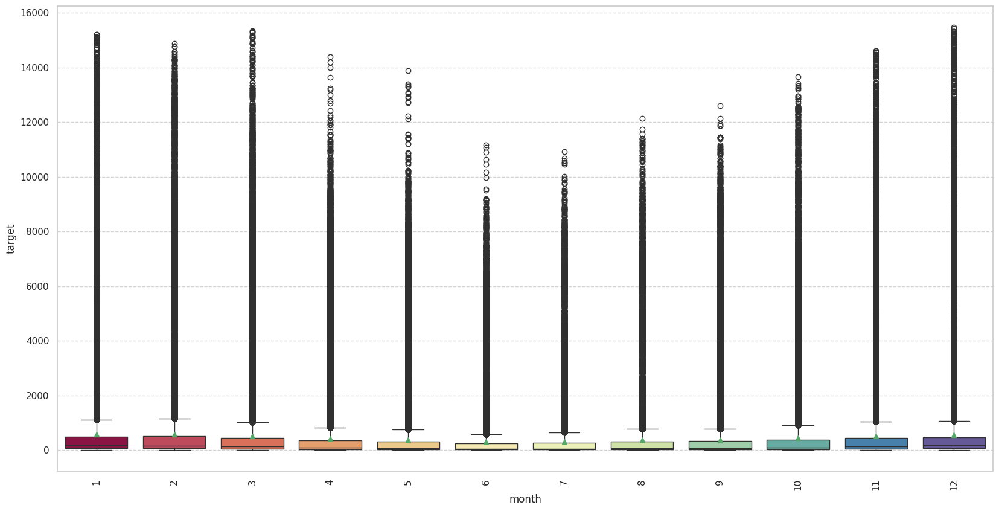

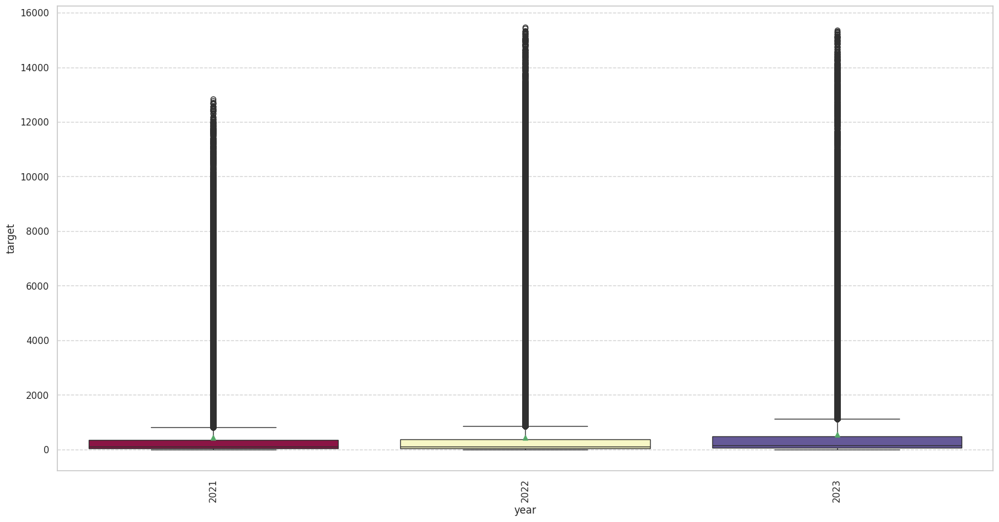

In [69]:
# Let's plot the consumption evolution
numeric_variables_list = ['target']
tim_rge = ['hour', 'day','month','year']
for idx, var in enumerate(numeric_variables_list):
    for t_i in tim_rge:
      fig, axes = plt.subplots(figsize=(20, 10))
      sns.boxplot(data=data[data['is_consumption']==1], x=t_i, y=var, showmeans=True, showfliers = True, hue=t_i, palette='Spectral', ax=axes,legend=False)
      plt.xticks(rotation=90)

(array([18901., 18993., 19083., 19174., 19266., 19358., 19448., 19539.]),
 [Text(18901.0, 0, '2021-10'),
  Text(18993.0, 0, '2022-01'),
  Text(19083.0, 0, '2022-04'),
  Text(19174.0, 0, '2022-07'),
  Text(19266.0, 0, '2022-10'),
  Text(19358.0, 0, '2023-01'),
  Text(19448.0, 0, '2023-04'),
  Text(19539.0, 0, '2023-07')])

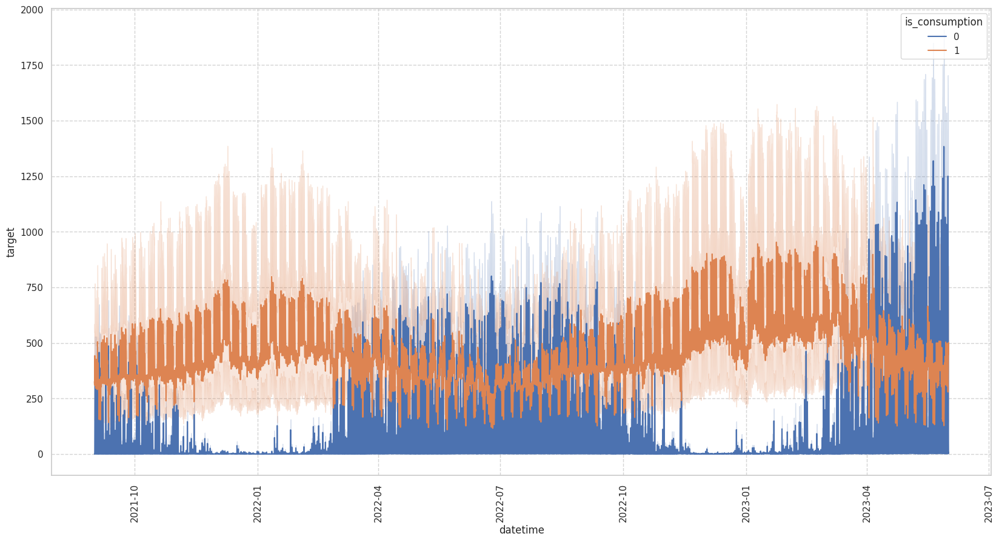

In [70]:
# Let's plot the distribution of the relevant features
fig, axes = plt.subplots(figsize=(20, 10))
sns.lineplot(data=data, x='datetime', y='target', hue='is_consumption', ax=axes)
plt.xticks(rotation=90)

## **11.4 Correlation analysis with stacked barplot**

###**11.4.1 Clients**

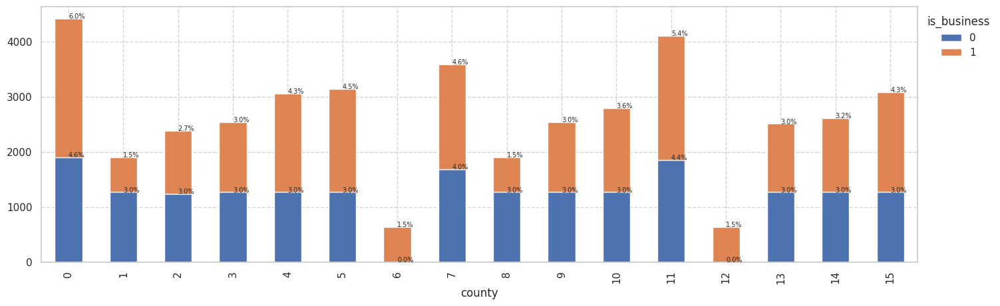

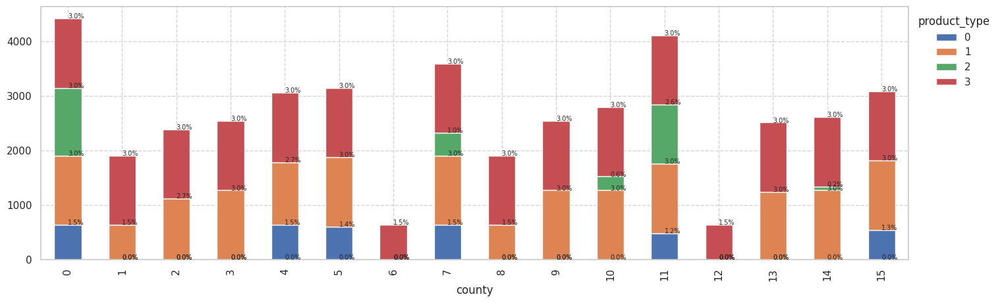

In [71]:
categorical_variables_x = ['county']
categorical_variables_y = ['is_business','product_type']

for idx, cat_var_x in enumerate(categorical_variables_x):
  x= cat_var_x

  for idy, cat_var_y in enumerate(categorical_variables_y):
      y= cat_var_y
      stacked_barplot(clients, x, y)

###**11.4.2 Data**

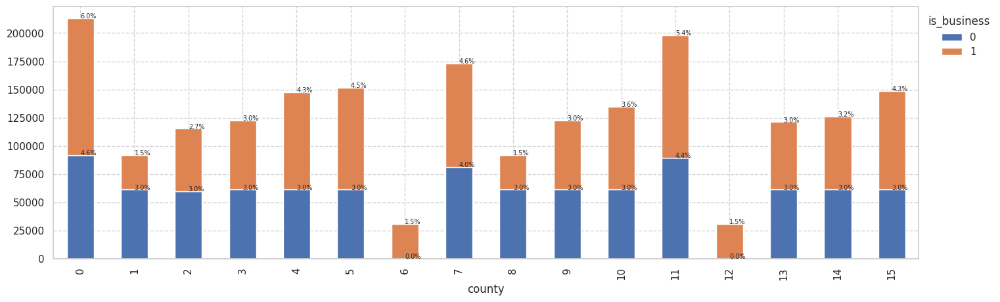

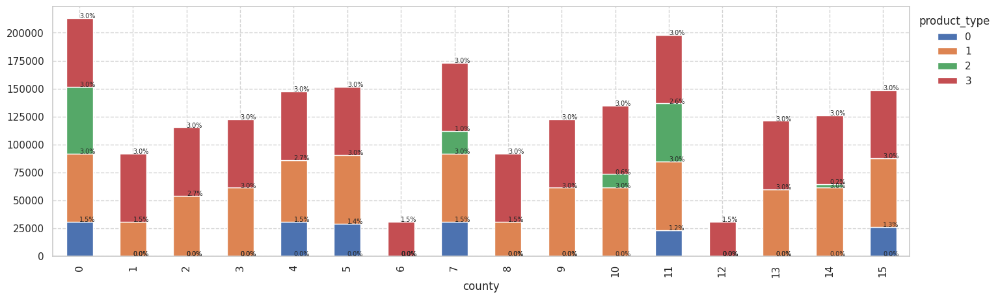

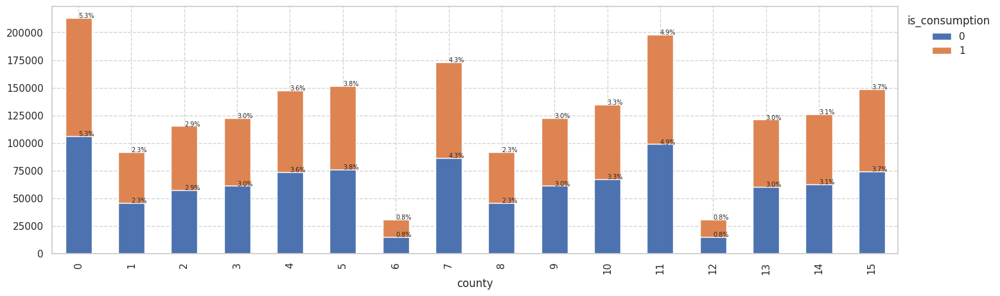

In [72]:
categorical_variables_x = ['county']
categorical_variables_y = ['is_business','product_type','is_consumption']

for idx, cat_var_x in enumerate(categorical_variables_x):
  x= cat_var_x

  for idy, cat_var_y in enumerate(categorical_variables_y):
      y= cat_var_y
      stacked_barplot(data, x, y)

# **12. Multivariate analysis**

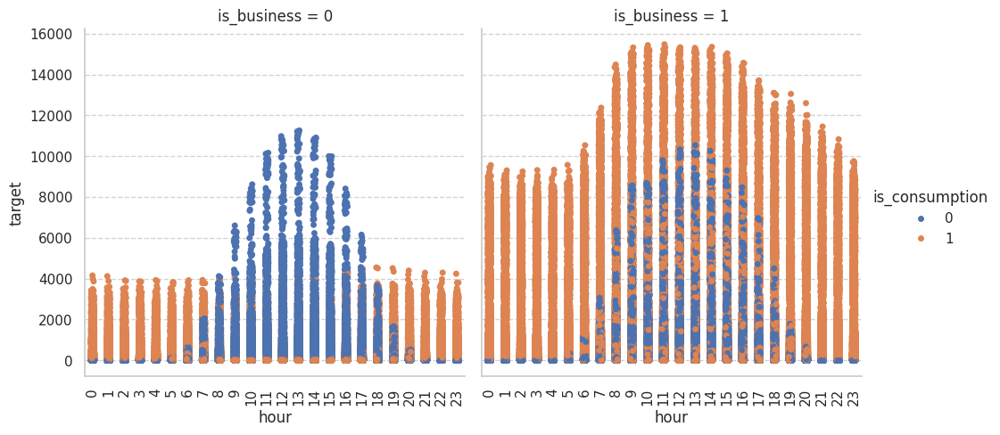

<Figure size 3000x3000 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


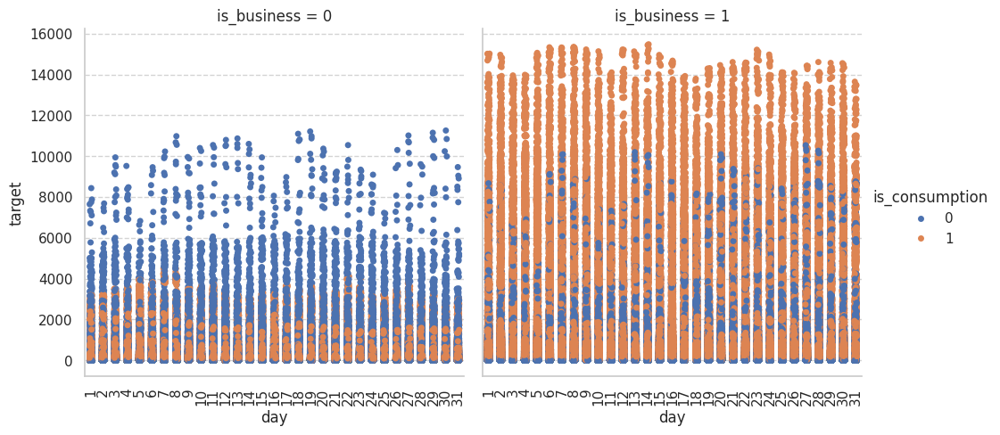

<Figure size 3000x3000 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


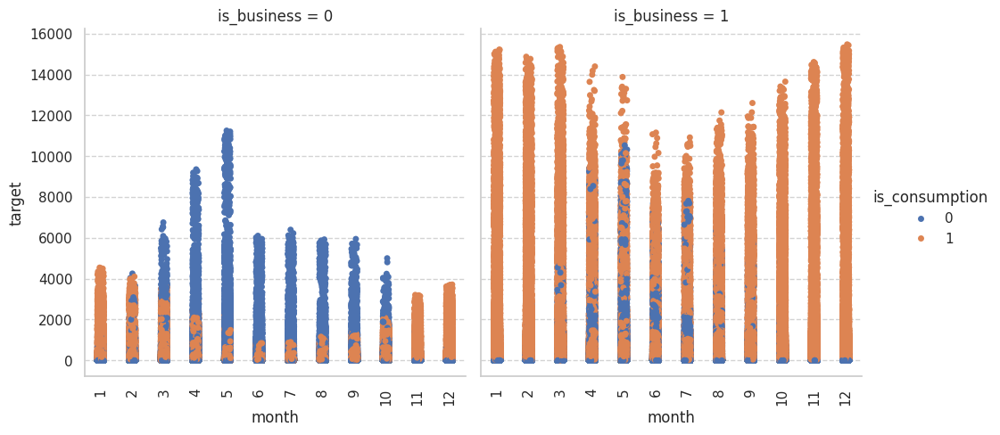

<Figure size 3000x3000 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


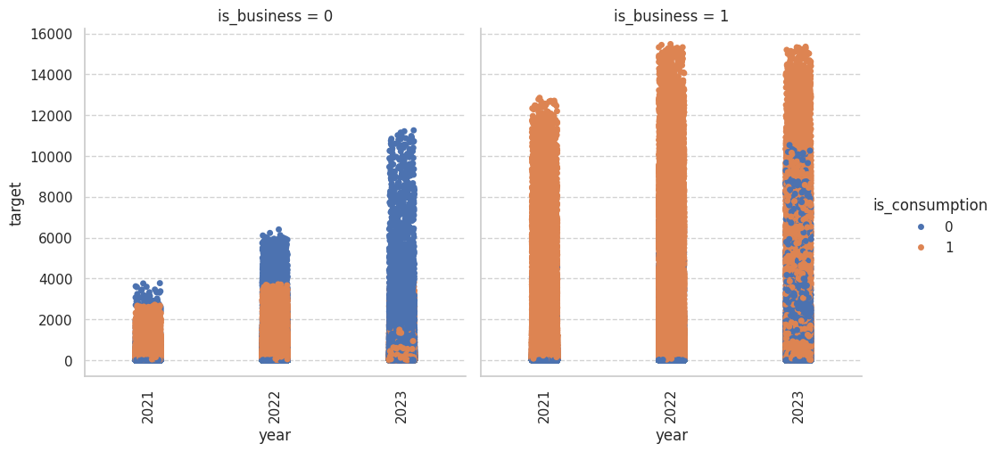

<Figure size 3000x3000 with 0 Axes>

In [74]:
# Let's visualize
numeric_variables_list = ['target']
tim_rge = ['hour','day','month','year']
for idx, var in enumerate(numeric_variables_list):
    for t_i in tim_rge:
      g=sns.catplot(kind='strip', data=data, x=t_i, y = 'target', hue='is_consumption', col='is_business')
      g.set_xticklabels(rotation=90)
      plt.figure(figsize=(30,30))
      plt.show()



<Figure size 3000x3000 with 0 Axes>

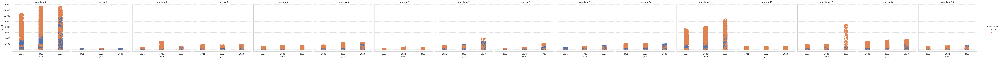

<Figure size 3000x3000 with 0 Axes>

In [77]:
sns.catplot(kind='strip', data=data, x='year', y = 'target', hue='is_business', col='county')
plt.figure(figsize=(30,30))

#**13. Scaling the target data**

In [78]:
data.set_index('datetime', inplace=True)

# **14. Splitting the dataset into train and test datasets**

In [79]:

def split_data(data, split_date):
    train_data = data.loc[data.index <= split_date]
    test_data = data.loc[data.index  > split_date]

## Extract the target (dependent/outcome) variable
    y_train = train_data['target']
    y_test = test_data['target']

## Separating independent variables (predictors) and the target variable
    x_train = train_data.drop(['target'], axis=1)
    x_test = test_data.drop(['target'], axis=1)

    return x_train, y_train, x_test, y_test

In [80]:
split_date = "2023-02-01 00:00:00"
x_train, y_train, x_test, y_test = split_data(data, split_date)

<Axes: xlabel='datetime'>

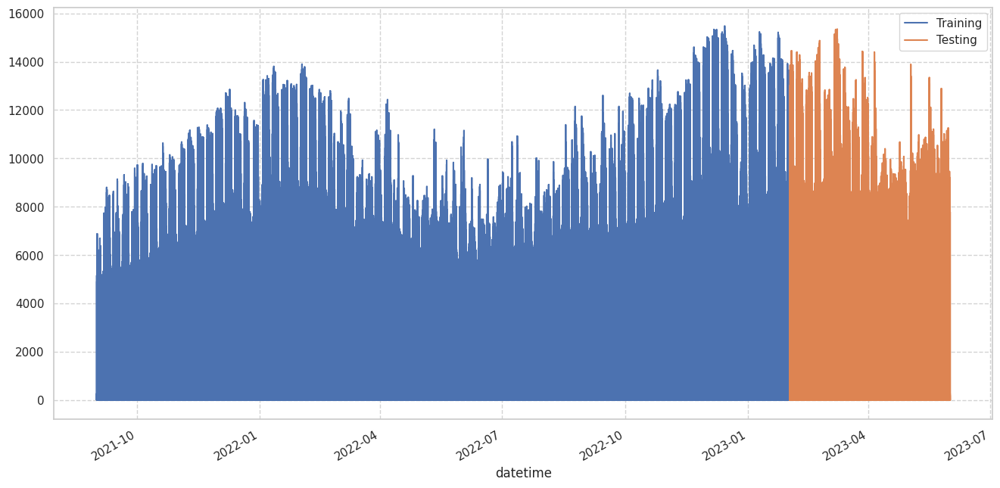

In [81]:
# Plot training and testing date splits
pd.DataFrame(y_train) \
    .rename(columns={'target': 'Training'}) \
    .join(pd.DataFrame(y_test).rename(columns={'target': 'Testing'}), how='outer') \
    .plot(figsize=(16,8))

#**15 Definition of models performance metrics**

In [82]:
# Compute the accuracy errors : MAE, MSE, RMSE, MAPE, R2 score.
def get_prediction_errors(y_true, y_pred):
    # pred = scaler.inverse_transform(y_pred)
    print(f"MAE: {mean_absolute_error(y_true, y_pred)}")

In [83]:
def plot_predictions(test, predicted):
    plt.figure(figsize=(16,8))
    plt.plot(test, label='Actual target')
    plt.plot(predicted, alpha=0.7, label='Predicted target')
    plt.xlabel('Time')
    plt.ylabel('Target')
    plt.legend()
    plt.show()

# **16. Models comparisons**

##**16.1 HISTGRADIENTBOOSTING REGRESSOR**

MAE: 149.49751954330364


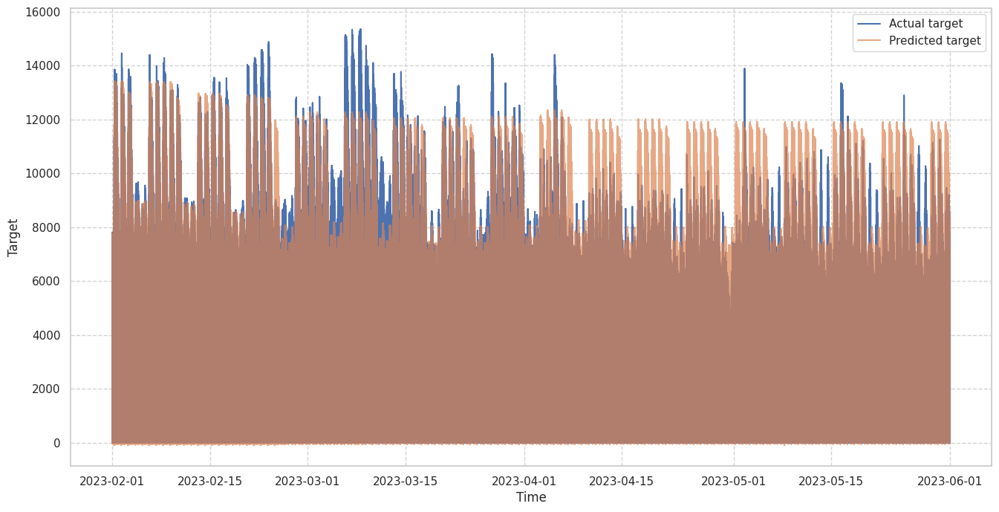

In [84]:
model_tuned = HistGradientBoostingRegressor(random_state=1)
model_tuned.fit(x_train, y_train)

test = pd.concat([y_test, pd.Series(model_tuned.predict(x_test), index=y_test.index)], axis=1)
test.columns = ["target", "Predicted target"]

get_prediction_errors(y_true=test["target"], y_pred=test["Predicted target"])

plot_predictions(test["target"], test["Predicted target"])

##**16.2 XGBOOST REGRESSOR**

MAE: 150.2803826614265


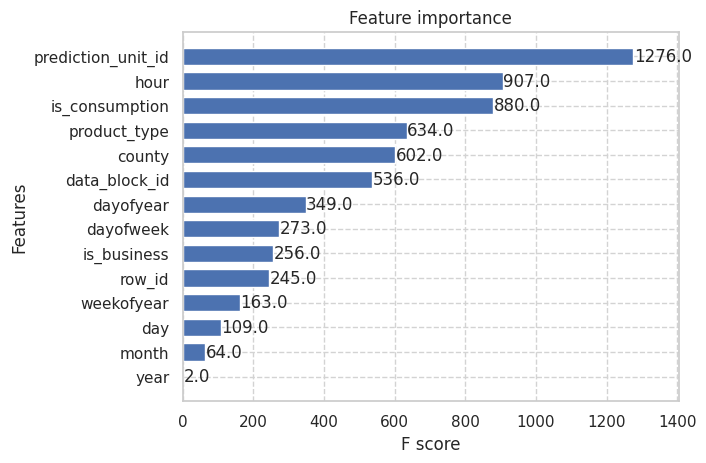

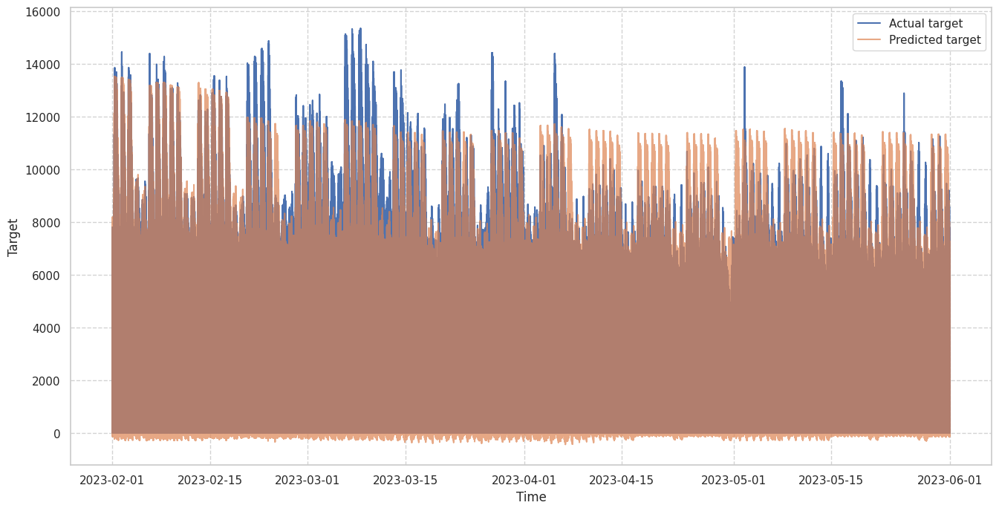

In [85]:
reg = XGBRegressor(random_state=1)
reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)], verbose=0)

import xgboost as xgb
_ = xgb.plot_importance(reg, height=0.7)

test = pd.concat([y_test, pd.Series(reg.predict(x_test), index=y_test.index)], axis=1)
test.columns = ["target", "Predicted target"]

get_prediction_errors(y_true=test["target"], y_pred=test["Predicted target"])

plot_predictions(test["target"], test["Predicted target"])

##**16.3 RandomForest REGRESSOR**

MAE: 137.07905930710334


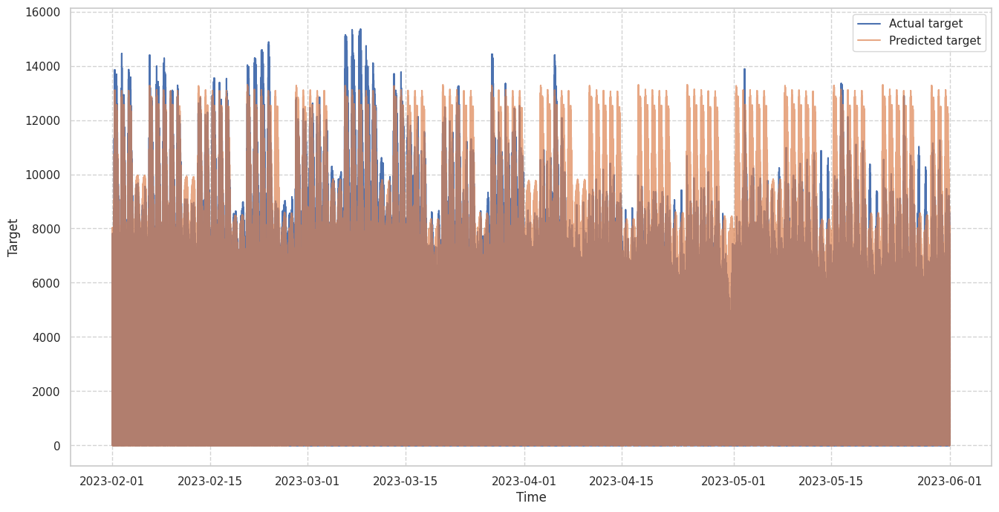

In [86]:
reg = RandomForestRegressor(n_estimators = 200, n_jobs= -1, random_state= 2, verbose = 0)

reg.fit(x_train, y_train)

test = pd.concat([y_test, pd.Series(reg.predict(x_test), index=y_test.index)], axis=1)
test.columns = ["target", "Predicted target"]

get_prediction_errors(y_true=test["target"], y_pred=test["Predicted target"])

plot_predictions(test["target"], test["Predicted target"])

##**16.4 ARIMA**

In [87]:
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from IPython.display import Image
import datetime as dt
import math

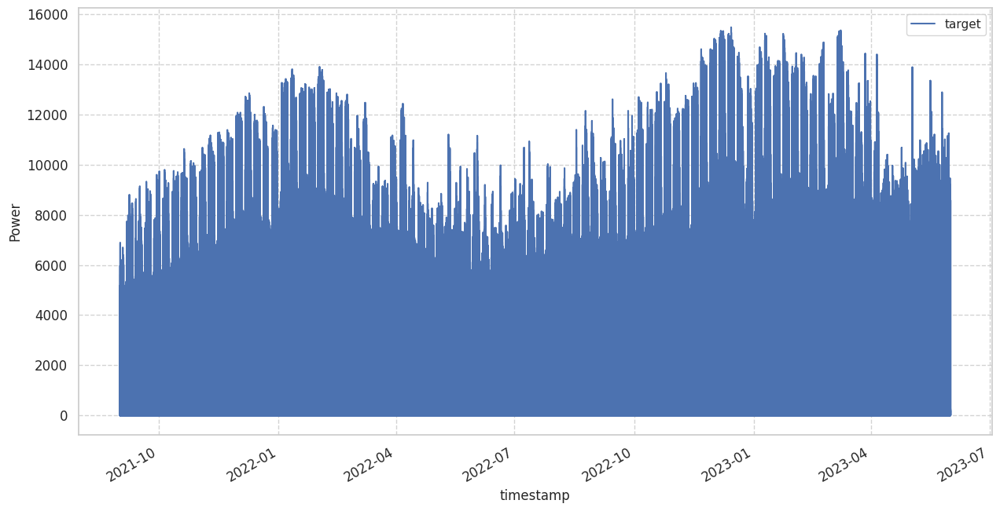

In [88]:
data.plot(y='target', subplots=True, figsize=(15, 8), fontsize=12)
plt.xlabel('timestamp', fontsize=12)
plt.ylabel('Power', fontsize=12)
plt.show()

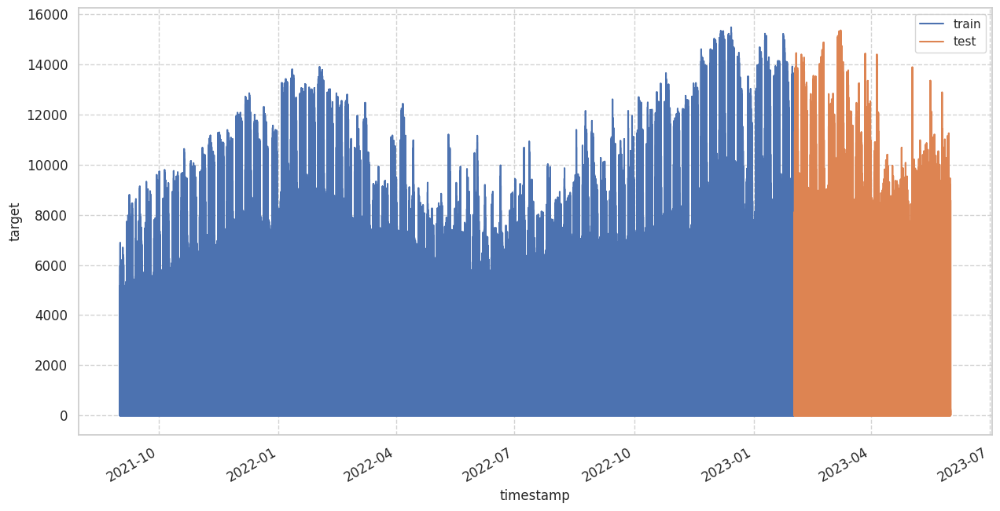

In [89]:
data[(data.index < split_date)][['target']].rename(columns={'target':'train'}) \
    .join(data[split_date:][['target']].rename(columns={'target':'test'}), how='outer') \
    .plot(y=['train', 'test'], figsize=(15, 8), fontsize=12)
plt.xlabel('timestamp', fontsize=12)
plt.ylabel('target', fontsize=12)
plt.show()

In [90]:
train = data.copy()[(data.index < split_date)][['target']]
test = data.copy()[data.index >= split_date][['target']]

print('Training data shape: ', train.shape)
print('Test data shape: ', test.shape)

Training data shape:  (1636848, 1)
Test data shape:  (381504, 1)


In [91]:
scaler = MinMaxScaler()
train['target'] = scaler.fit_transform(train)
test['target'] = scaler.fit_transform(test)


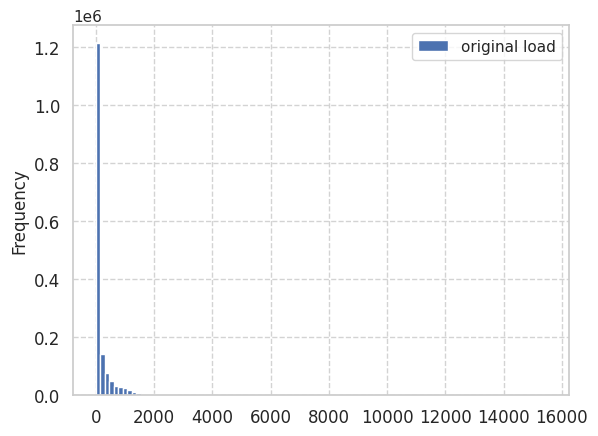

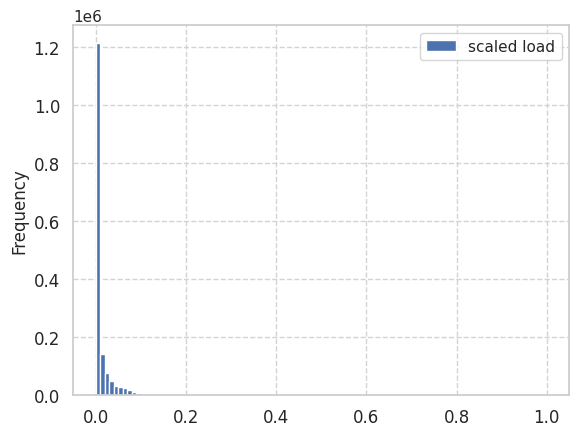

In [92]:
data[(data.index < split_date)][['target']].rename(columns={'target':'original load'}).plot.hist(bins=100, fontsize=12)
train.rename(columns={'target':'scaled load'}).plot.hist(bins=100, fontsize=12)
plt.show()

In [93]:
# # Specify the number of steps to forecast ahead
# HORIZON = 3
# print('Forecasting horizon:', HORIZON, 'hours')

Forecasting horizon: 3 hours


In [ ]:
# order = (4, 1, 0)
# seasonal_order = (1, 1, 0, 24)

# train.index = pd.DatetimeIndex(train.index).to_period('h')

# model = SARIMAX(endog=train, order=order, seasonal_order=seasonal_order)
# results = model.fit()

# print(results.summary())

In [ ]:
# test_shifted = test.copy()

# for t in range(1, HORIZON+1):
#     test_shifted['target+'+str(t)] = test_shifted['target'].shift(-t, freq='H')

# test_shifted = test_shifted.dropna(how='any')
# test_shifted.head(5)

In [ ]:
# %%time
# training_window = 720 # dedicate 30 days (720 hours) for training

# train_ts = train['target']
# test_ts = test_shifted

# history = [x for x in train_ts]
# history = history[(-training_window):]

# predictions = list()

# order = (2, 1, 0)
# seasonal_order = (1, 1, 0, 24)

# for t in range(test_ts.shape[0]):
#     model = SARIMAX(endog=history, order=order, seasonal_order=seasonal_order)
#     model_fit = model.fit()
#     yhat = model_fit.forecast(steps = HORIZON)
#     predictions.append(yhat)
#     obs = list(test_ts.iloc[t])
#     # move the training window
#     history.append(obs[0])
#     history.pop(0)
#     print(test_ts.index[t])
#     print(t+1, ': predicted =', yhat, 'expected =', obs)

In [ ]:
# eval_df = pd.DataFrame(predictions, columns=['t+'+str(t) for t in range(1, HORIZON+1)])
# eval_df['timestamp'] = test.index[0:len(test.index)-HORIZON+1]
# eval_df = pd.melt(eval_df, id_vars='timestamp', value_name='prediction', var_name='h')
# eval_df['actual'] = np.array(np.transpose(test_ts)).ravel()
# eval_df[['prediction', 'actual']] = scaler.inverse_transform(eval_df[['prediction', 'actual']])
# eval_df.head()

In [ ]:
#  if(HORIZON == 1):
#     ## Plotting single step forecast
#     eval_df.plot(x='timestamp', y=['actual', 'prediction'], style=['r', 'b'], figsize=(15, 8))

# else:
#     ## Plotting multi step forecast
#     plot_df = eval_df[(eval_df.h=='t+1')][['timestamp', 'actual']]
#     for t in range(1, HORIZON+1):
#         plot_df['t+'+str(t)] = eval_df[(eval_df.h=='t+'+str(t))]['prediction'].values

#     fig = plt.figure(figsize=(15, 8))
#     ax = plt.plot(plot_df['timestamp'], plot_df['actual'], color='red', linewidth=4.0)
#     ax = fig.add_subplot(111)
#     for t in range(1, HORIZON+1):
#         x = plot_df['timestamp'][(t-1):]
#         y = plot_df['t+'+str(t)][0:len(x)]
#         ax.plot(x, y, color='blue', linewidth=4*math.pow(.9,t), alpha=math.pow(0.8,t))

#     ax.legend(loc='best')

# plt.xlabel('timestamp', fontsize=12)
# plt.ylabel('load', fontsize=12)
# plt.show()

#**17. Prepare for submission**

In [ ]:
# ## Loading and reading of the test dataset files
# df_test = pd.read_csv('/content/Enefit/example_test_files/test.csv')
# df_sbm = pd.read_csv('/content/Enefit/submission.csv')

# df_test["prediction_datetime"] = pd.to_datetime(df_test["prediction_datetime"], format='%Y-%m-%d %H:%M:%S')

# df_test['year'] = df_test['prediction_datetime'].dt.year
# df_test['month'] = df_test['prediction_datetime'].dt.month
# df_test['day'] = df_test['prediction_datetime'].dt.day
# df_test['hour'] = df_test['prediction_datetime'].dt.hour

# df_test['dayofyear'] = df_test['prediction_datetime'].dt.dayofyear
# df_test['dayofweek'] = df_test['prediction_datetime'].dt.dayofweek
# df_test['weekofyear'] = df_test['prediction_datetime'].dt.isocalendar().week.astype("int")
# df_test['quarter'] = df_test['prediction_datetime'].dt.quarter

# df_test.set_index('prediction_datetime', inplace=True)


# df_test.drop(columns=['currently_scored'], inplace=True)
# df_test.sample(5)

#**18. Submission via Kaggle API**

In [ ]:
# !kaggle competitions submit -c predict-energy-behavior-of-prosumers -f submission.csv -m "Message"

In [ ]:
# !apt-get install ENEFIT

In [ ]:
# import enefit
# env = enefit.make_env()
# iter_test = env.iter_test()
# counter = 0
# for (test, revealed_targets, client, historical_weather,
#         forecast_weather, electricity_prices, gas_prices, sample_prediction) in iter_test:
#     if counter == 0:
#         print(test.head(3))
#         print(revealed_targets.head(3))
#         print(client.head(3))
#         print(historical_weather.head(3))
#         print(forecast_weather.head(3))
#         print(electricity_prices.head(3))
#         print(gas_prices.head(3))
#         print(sample_prediction.head(3))
#     sample_prediction['target'] = 0
#     env.predict(sample_prediction)
#     counter += 1
